---
# pRF in the line

In [202]:
%reload_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import pandas as pd
import nideconv as nd
from nideconv import simulate
import nibabel as nb
from prfpy import *
from prfpy.stimulus import PRFStimulus2D
from prfpy.model import Iso2DGaussianModel,Norm_Iso2DGaussianModel
from prfpy.fit import Iso2DGaussianFitter,Norm_Iso2DGaussianFitter
from linescanning import *
from linescanning import glm,image,prf,utils
from scipy.io import loadmat
import matplotlib.pyplot as plt
import warnings
import matplotlib.patches as patches
import seaborn as sns
import os

opj = os.path.join
base, place = utils.get_base_dir()

base_dir = opj(base, 'projects', 'hemifield')
fig_dir = opj(base_dir, 'code', 'figures')

# ignore warnings
warnings.simplefilter("ignore")

In [4]:
# Load data
sub         = '003'
ses         = 3
task        = "task-pRF"
run         = 4

func_file   = opj(base_dir, f"sub-{sub}", f"ses-{ses}", "func", f"sub-{sub}_ses-{ses}_{task}_run-{run}_bold.mat")
print(func_file)

/data1/projects/MicroFunc/Jurjen/projects/hemifield/sub-003/ses-3/func/sub-003_ses-3_task-pRF_run-4_bold.mat


Shape dm = (500, 500, 120)
[0.74, -2.28, 0.44, 0.0, -0.22, 0.74]


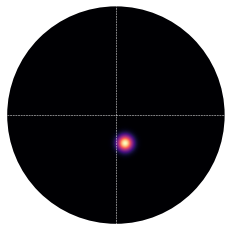

In [220]:
design_fn = utils.get_file_from_substring("vis_design.mat", opj(base_dir, 'derivatives', 'prf', f"sub-{sub}"))
params_fn = utils.get_file_from_substring("best_vertices", opj(base_dir, 'derivatives', 'pycortex', f"sub-{sub}"))

if os.path.exists(design_fn):
    design_matrix = loadmat(design_fn)
    print(f"Shape dm = {design_matrix['stim'].shape}")
else:
    raise ValueError(f"Could not find {design_fn}")


if os.path.exists(params_fn):
    params_df = utils.VertexInfo(params_fn)
    params = params_df.get('prf', hemi='L')
else:
    params = np.array([2.283,-0.742,1.039,0.189,-0.163,0.01,18.,0.189,1.,0.745])

print([round(i,2) for i in params])
vf_extent = [-5, 5]
prf_stim = stimulus.PRFStimulus2D(screen_size_cm=70, screen_distance_cm=225, design_matrix=design_matrix['stim'],TR=1.5)

prf_array = prf.make_prf(prf_stim, size=params[2], mu_x=params[0], mu_y=params[1])
prf.plot_prf(prf_array, vf_extent)

In [223]:
example = [1.79, -2.46, 0.71, 0.0, -0.56, 0.56]
# example = [2.002,-0.609,1.931,0.478,0,0.017,53.047,400.364,93.341,0.467]

import math
 
# Function to calculate distance
def distance(x1,y1,x2,y2):
 
    # Calculating distance
    return math.sqrt(math.pow(x2 - x1, 2) +
                math.pow(y2 - y1, 2) * 1.0)
 
# Drivers Code
print("%.6f"%distance(params[0],params[1],example[0],example[1]))

1.063274


In [206]:
bp_type = "boxcar"
window = 5
func = utils.ParseFuncFile(func_file, 
                           subject=1, 
                           run=1, 
                           deleted_first_timepoints=200, 
                           deleted_last_timepoints=200,
                           bp_filter=bp_type,
                           window_size=window)

# Fetch dataframes
raw         = func.get_raw(index=True)

if bp_type == "rolling":
    filtered    = func.dct_psc_rol
else:
    filtered    = func.get_psc(index=True)

# beginning of window = NaN
print(f"Func data has shape {filtered.shape}")
filtered.head(30)                           

Func data has shape (5600, 720)


vox 0      vox 1      vox 2     vox 3      vox 4  \
subject run t                                                             
1       1   0.000 -20.518303   6.495965  34.800041  6.146073   1.588953   
            0.105 -19.855452   6.820416  33.107101  7.337141  -1.033729   
            0.210 -17.328703   5.714929  25.941526  6.609833  -1.636970   
            0.315 -14.581638   3.393626  19.824755  6.575489  -1.877892   
            0.420 -12.206459   4.183483  13.544917  4.885566  -4.648548   
            0.525 -12.198096   0.657845   8.611250  4.014909  -7.700234   
            0.630  -7.022333  -1.503754   1.812279  1.847315  -6.452447   
            0.735  -3.081334  -4.783339  -4.420543  1.124644  -7.358003   
            0.840  -0.985360  -8.274460 -10.242319  0.468755  -8.985460   
            0.945   0.792086  -8.483964 -16.043180 -1.371109  -9.942526   
            1.050   1.336050  -9.014935 -20.903784 -4.109013 -11.044621   
            1.155   4.414058  -9.286362 -24.707878 -2.859062 -13.861984   
            1.260   5.260980 -10.089040 -26.124556 -3.658372 -15.322274   
            1.365   6.152904 -11.805511 -28.458668 -5.061894 -16.480238   
            1.470   8.284437 -15.388817 -31.010223 -4.621524 -14.764404   
            1.575   9.813094 -18.359066 -37.555634 -6.339049 -14.918720   
            1.680  12.518454 -21.866720 -43.282581 -5.719161 -17.879290   
            1.785  14.689279 -21.736908 -49.405525 -9.279818 -19.529598   
            1.890  14.345348 -21.795910 -49.906612 -8.403063 -22.652138   
            1.995  15.453315 -21.700346 -52.301834 -7.932562 -22.424967   
            2.100  11.053705 -19.171721 -52.191605 -6.853199 -22.583086   
            2.205  12.259949 -20.160204 -52.283943 -5.009562 -23.035229   
            2.310  11.547005 -17.692543 -53.838528 -6.193614 -22.980721   
            2.415  12.600756 -15.662914 -49.251312 -5.954832 -20.565420   
            2.520  11.514449 -17.778564 -47.940033 -4.601484 -20.090378   
            2.625  11.557007 -15.324068 -48.396439 -3.674394 -21.662361   
            2.730  16.012466 -11.362928 -47.269131 -8.512521 -20.929462   
            2.835  15.605772 -11.949044 -43.655659 -8.912743 -22.104370   
            2.940  20.371998 -11.597776 -41.582550 -6.998289 -22.191042   
            3.045  20.219194 -11.709338 -44.420666 -7.857716 -18.025881   

                       vox 5      vox 6      vox 7      vox 8      vox 9  ...  \
subject run t                                                             ...   
1       1   0.000   1.274610  14.166212  20.967138 -26.181978  -1.649004  ...   
            0.105   1.420891  15.197670  20.612967 -22.929705  -0.847077  ...   
            0.210   2.044475  11.021519  20.392561 -19.150734  -2.987427  ...   
            0.315   8.049846  10.282993  18.946350 -11.793959  -1.117200  ...   
            0.420   7.348228   5.911374  16.117191 -11.163748   0.870633  ...   
            0.525   6.941259   1.764643  13.196409  -8.870035  -1.375204  ...   
            0.630   6.103647   1.819837   9.366714  -6.079525   1.858771  ...   
            0.735   6.233931   1.355493   6.274021  -5.032730   1.070929  ...   
            0.840   8.574986   0.100422   4.362595  -4.571950   0.454712  ...   
            0.945  10.159230  -4.223526   5.397499  -0.636071  -1.001704  ...   
            1.050  10.385620  -5.723542   2.018344   2.235210  -1.698744  ...   
            1.155   9.377039  -7.430768   0.409257   6.978834   2.467954  ...   
            1.260   9.153616 -11.033553  -2.760392   8.339119   2.101302  ...   
            1.365   7.264137 -15.113664  -4.501778   8.548916   1.116478  ...   
            1.470   8.389854 -16.311472  -2.127266  14.240562  -1.791734  ...   
            1.575   7.374024 -18.309175  -4.295027  15.755976  -3.913057  ...   
            1.680   8.056963 -20.683796  -5.750346  18.138908  -3.759015  ...   
            1.785   7.191801 -23.494482  -4.494709  20.674515  -6.534761  ...   
  

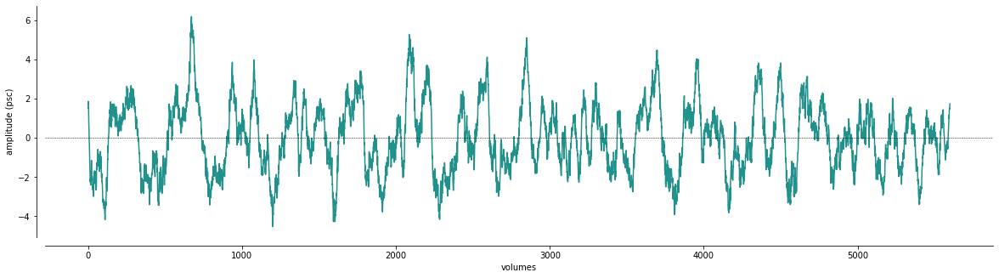

In [207]:
glm.plot_array(filtered['vox 359'].values, 
               figsize=(20,5),
               x_label="volumes",
               y_label="amplitude (psc)",
               add_hline={'pos': 0, 'ls': '--', 'color': 'k', 'lw': 0.5})


In [194]:
n_pix = 270

log_dir = "/data1/projects/MicroFunc/Jurjen/projects/hemifield/sourcedata/sub-003/ses-3/task/sub-003_ses-3_run-full20min/"
design_matrix_line = prf.create_line_prf_matrix(log_dir, 
                                                stim_duration=0.315, 
                                                n_pix=n_pix, 
                                                deleted_first_timepoints=func.deleted_first_timepoints,
                                                deleted_last_timepoints=0,
                                                TR=func.TR,
                                                skip_first_img=False)

design_matrix_line.shape

Baseline before has shape: (270, 270, 28)
Design itself has shape: (270, 270, 10500)
Baseline after has shape: (270, 270, 228)


(270, 270, 10756)

In [195]:
dm_partial_acq = design_matrix_line[...,:filtered.shape[0]]
print(dm_partial_acq.shape)

(270, 270, 5600)


In [208]:
iterations = int(np.floor((dm_partial_acq.shape[-1]-28)/1500))

nr_trials_3iter = 28+(3*1500)
print(f"partial acquisition had {iterations} full iterations; totalling {nr_trials_3iter} trials")

dm_3iter_acq = design_matrix_line[...,:nr_trials_3iter]
print(f"design matrix has shape {dm_3iter_acq.shape}")

data_3iter_acq = filtered.values[:nr_trials_3iter,...]
print(f"data has shape {data_3iter_acq.shape}")

partial acquisition had 3 full iterations; totalling 4528 trials
design matrix has shape (270, 270, 4528)
data has shape (4528, 720)


In [209]:
# average data covering each iterations
data_1iter = []
start = 28
for ii in range(iterations):
    data_1iter.append(data_3iter_acq[start:start+1500][...,np.newaxis])
    start += 1500

data_1iter = np.concatenate((data_1iter), axis=-1)
print(data_1iter.shape)

# average
data_iters_avg = np.mean(data_1iter, axis=-1)
print(f"Avg data has shape {data_iters_avg.shape}")
# add back baseline
data_iters_avg = np.vstack((data_3iter_acq[:28,...], data_iters_avg))
print(f"Avg data with baseline has shape {data_iters_avg.shape}")

# match design matrix with data shape
dm_iters_avg = dm_3iter_acq[...,:data_iters_avg.shape[0]]
print(f"Design matrix with baseline has shape {dm_iters_avg.shape}")


(1500, 720, 3)
Avg data has shape (1500, 720)
Avg data with baseline has shape (1528, 720)
Design matrix with baseline has shape (270, 270, 1528)


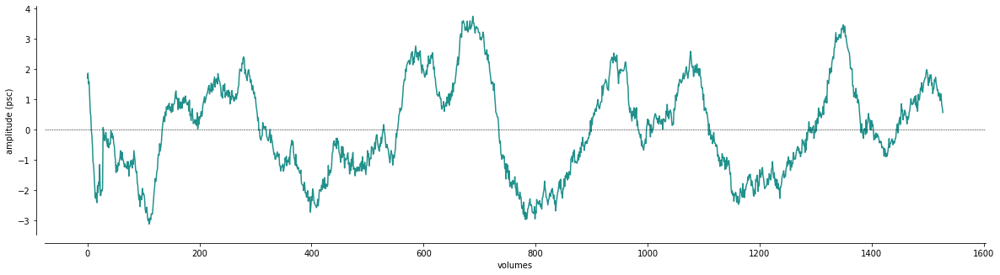

In [210]:
glm.plot_array(data_iters_avg[...,359], 
               figsize=(20,5),
               x_label="volumes",
               y_label="amplitude (psc)",
               add_hline={'pos': 0, 'ls': '--', 'color': 'k', 'lw': 0.5})


---
# pRF fit 1 vox

In [211]:
# create stimulus
vf_extent = [-5, 5]
distance = 225
prf_stim = stimulus.PRFStimulus2D(screen_size_cm=70, 
                                  screen_distance_cm=distance, 
                                  design_matrix=dm_iters_avg,
                                  TR=func.TR)

# create grid
grid_nr = 20
max_ecc_size = 15
sizes, eccs, polars = max_ecc_size * np.linspace(0.125,1,grid_nr)**2, \
                    max_ecc_size * np.linspace(0.05,1,grid_nr)**2, \
                        np.linspace(0, 2*np.pi, grid_nr, endpoint=False)

gg_vox = Iso2DGaussianModel(stimulus=prf_stim,
                             filter_predictions=False,
                             filter_type='sg',
                             filter_params={'window_length':300, 
                                            'polyorder':1})

In [212]:
plot_vox = 359
vox_data = data_iters_avg[...,plot_vox]     

if vox_data.ndim == 1:
    vox_data = vox_data[np.newaxis,...]
print(vox_data.shape)

(1, 1528)


In [213]:
# fit
gf_vox = Iso2DGaussianFitter(data=vox_data, model=gg_vox, fit_css=False)

gf_vox.grid_fit(ecc_grid=eccs,
                 polar_grid=polars,
                 size_grid=sizes, 
                 pos_prfs_only=False)

fit for vox 359 = 0.736430823802948
line: [1.75, -0.57, 1.43, 0.0, -1.05, 0.74]


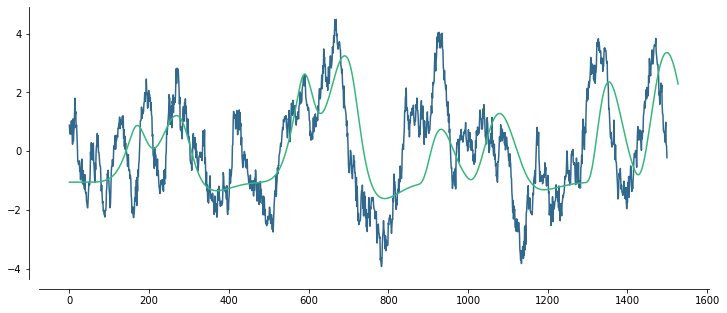

In [215]:
params_line = gf_vox.gridsearch_params[0]
print(f"fit for vox {plot_vox} = {params_line[-1]}")
# print(f"wb:   {[round(ii,2) for ii in params]}")
print(f"line: {[round(ii,2) for ii in params_line]}")
data = gf_vox.data[0,:]
pred = gg_vox.return_prediction(*params_line[:-1])[0]
glm.plot_array([data_1iter[:,plot_vox,2],pred])

In [ ]:
# iterative fit
eps = 1e-1
ss = prf_stim.screen_size_degrees
xtol = 0.00001
ftol = 0.00001
constraints_norm = []
rsq_threshold = 0.1

# define bounds
gauss_bounds = [(-1.5*max_ecc_size, 1.5*max_ecc_size),  # x
                (-1.5*max_ecc_size, 1.5*max_ecc_size),  # y
                (eps, 1.5*ss),  # prf size
                (-80, 80),  # prf amplitude
                (-60, 60),]  # bold baseline      

gf_vox.iterative_fit(rsq_threshold=rsq_threshold, 
                      verbose=True,
                      bounds=gauss_bounds,
                      constraints=constraints_norm,
                      xtol=xtol,
                      ftol=ftol)

In [ ]:
params_line = gf_vox.gridsearch_params[0]
print(f"fit for vox {plot_vox} = {params_line[-1]}")
# print(f"wb:   {[round(ii,2) for ii in params]}")
print(f"line: {[round(ii,2) for ii in params_line]}")
data = gf_vox.data[vox,:]
pred = gg_vox.return_prediction(*params_line[:-1])[0]
glm.plot_array([data,pred])

---
# pRF fit all vox

In [44]:
# create stimulus
vf_extent = [-5, 5]
distance = 225
prf_stim = stimulus.PRFStimulus2D(screen_size_cm=70, 
                                  screen_distance_cm=distance, 
                                  design_matrix=dm_iters_avg,
                                  TR=func.TR)

# create grid
grid_nr = 20
max_ecc_size = 15
sizes, eccs, polars = max_ecc_size * np.linspace(0.125,1,grid_nr)**2, \
                    max_ecc_size * np.linspace(0.05,1,grid_nr)**2, \
                        np.linspace(0, 2*np.pi, grid_nr, endpoint=False)

gg_line = Iso2DGaussianModel(stimulus=prf_stim,
                             filter_predictions=False,
                             filter_type='sg',
                             filter_params={'window_length':300, 
                                            'polyorder':1})

In [45]:
# fit
gf_line = Iso2DGaussianFitter(data=data_iters_avg.T, model=gg_line, fit_css=False)

gf_line.grid_fit(ecc_grid=eccs,
                 polar_grid=polars,
                 size_grid=sizes, 
                 pos_prfs_only=False)

fit for vox 359 = 0.5264198780059814
line: [1.75, -0.57, 1.43, 0.0, -0.75, 0.53]


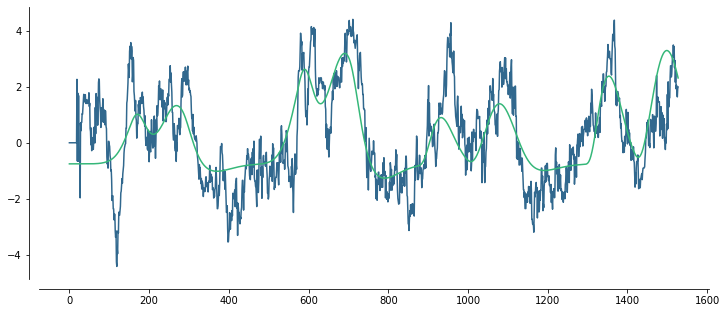

In [126]:
vox = 359
params_line = gf_line.gridsearch_params[vox,:]
print(f"fit for vox {vox} = {params_line[-1]}")
# print(f"wb:   {[round(ii,2) for ii in params]}")
print(f"line: {[round(ii,2) for ii in params_line]}")
data = gf_line.data[vox,:]
pred = gg_line.return_prediction(*params_line[:-1])[0]
glm.plot_array([data,pred])

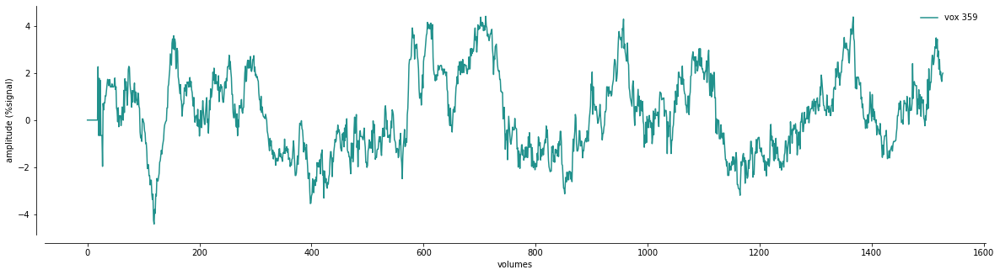

In [132]:
fig,axs = plt.subplots(figsize=(20,5))
ribbon = [355,363]

plot_vox = 359
colors = sns.color_palette('viridis', 1)

axs.plot(data_iters_avg[:,plot_vox], color=colors[0], label=f"vox {plot_vox}")

axs.set_xlabel("volumes")
axs.set_ylabel("amplitude (%signal)")
axs.legend(frameon=False)
sns.despine(offset=10)

In [129]:
# iterative fit
eps = 1e-1
ss = prf_stim.screen_size_degrees
xtol = 0.00001
ftol = 0.00001
constraints_norm = []
rsq_threshold = 0.1

# define bounds
gauss_bounds = [(-1.5*max_ecc_size, 1.5*max_ecc_size),  # x
                (-1.5*max_ecc_size, 1.5*max_ecc_size),  # y
                (eps, 1.5*ss),  # prf size
                (-80, 80),  # prf amplitude
                (-60, 60),]  # bold baseline      

gf_line.iterative_fit(rsq_threshold=rsq_threshold, 
                      verbose=True,
                      bounds=gauss_bounds,
                      constraints=constraints_norm,
                      xtol=xtol,
                      ftol=ftol)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Performing bounded, constrained minimization (trust-constr).
`gtol` termination condition is satisfied.
Number of iterations: 73, function evaluations: 438, CG iterations: 269, optimality: 3.02e-06, constraint violation: 0.00e+00, execution time: 1.6e+01 s.
Performing bounded, constrained minimization (trust-constr).
`xtol` termination condition is satisfied.
Number of iterations: 91, function evaluations: 756, CG iterations: 249, optimality: 1.13e+00, constraint violation: 0.00e+00, execution time: 2.7e+01 s.
Performing bounded, constrained minimization (trust-constr).
`gtol` termination condition is satisfied.
Number of iterations: 44, function evaluations: 228, CG iterations: 104, optimality: 3.08e-06, constraint violation: 0.00e+00, execution time:  7.9 s.
Performing bounded, constrained minimization (trust-constr).
`xtol` termination condition is satisfied.
Number of iterations: 145, function evaluations: 834, CG iterations: 543, optimality: 9.71e-04, constraint violation: 0.00e+0

[Parallel(n_jobs=1)]: Done 314 out of 314 | elapsed: 229.5min finished


In [140]:
data_iters_avg.shape

(1528, 720)

In [155]:
gg_line_norm = Norm_Iso2DGaussianModel(stimulus=prf_stim,
                                  filter_predictions=False,
                                  filter_type='sg',
                                  filter_params={'window_length':300,'polyorder':1})

# only run iterative fit on ribbon voxels
data = data_iters_avg[...,plot_vox]

if data.ndim == 1:
    data = data[np.newaxis,...]
print(data.shape)

(1, 1528)


In [156]:
# initiate fitter
gf_line_norm = Norm_Iso2DGaussianFitter(gg_line_norm, data)

# Run iterative fit with Normalization model; make n_units x 4 array, with X,Y,size,r2
old_params_arr = gf_line.iterative_search_params
print(old_params_arr[plot_vox,...])
old_params = np.hstack((old_params_arr[plot_vox,:3], old_params_arr[plot_vox,-1][...,np.newaxis]))

if old_params.ndim == 1:
    old_params = old_params[np.newaxis,...]
print(old_params.shape)

[ 1.863 -0.778  1.241  0.004 -0.739  0.53 ]
(1, 4)


In [157]:
# define parameters
surround_amplitude_grid=np.array([0.01,0.1,1,10], dtype='float32')
surround_size_grid=np.array([5,8,12,18], dtype='float32')
neural_baseline_grid=np.array([0,1,10,100], dtype='float32')
surround_baseline_grid=np.array([0.1,1.0,10.0,100.0], dtype='float32')

# run gridfit
gf_line_norm.grid_fit(surround_amplitude_grid, surround_size_grid, neural_baseline_grid,surround_baseline_grid, gaussian_params=old_params)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    2.7s finished


In [167]:
gf_line_norm.starting_params

array([[  1.863,  -0.778,   1.241,   1.906,  -0.839,   0.1  ,  18.   ,
          0.   , 100.   ,   0.558]])

In [168]:
# iterative fit
eps = 1e-1
ss = prf_stim.screen_size_degrees
xtol = 0.00001
ftol = 0.00001
constraints_norm = []
rsq_threshold = 0.1

norm_bounds = [(-1.5*max_ecc_size, 1.5*max_ecc_size),   # x
                (-1.5*max_ecc_size, 1.5*max_ecc_size),  # y
                (eps, 1.5*ss),                          # activation size
                (-80, 80),                              # activation amplitude       = A term
                (-60, 60),                              # activation baseline
                (0, 1000),                              # normalization amplitude  = C term
                (eps, 3*ss),                            # normalization size
                (1e-6, 1000)]                           # normalization baseline   = D term

norm_bounds = [(-1.5*max_ecc_size, 1.5*max_ecc_size),   # x
                (-1.5*max_ecc_size, 1.5*max_ecc_size),  # y
                (eps, 1.5*ss),                          # prf size
                (0, 1000),                              # prf amplitude       = A term
                (0, 1000),                              # bold baseline
                (0, 1000),                              # surround amplitude  = C term
                (eps, 3*ss),                            # surround size
                (0, 1000),                              # neural baseline     = B term
                (1e-6, 1000)]                           # surround baseline   = D term
                
gf_line_norm.iterative_fit(rsq_threshold=rsq_threshold, 
                           verbose=True,
                           bounds=norm_bounds,
                           constraints=constraints_norm,
                           xtol=xtol,
                           ftol=ftol)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Performing bounded, constrained minimization (trust-constr).
`xtol` termination condition is satisfied.
Number of iterations: 372, function evaluations: 3780, CG iterations: 2198, optimality: 9.12e-05, constraint violation: 0.00e+00, execution time: 3e+02 s.


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  5.0min finished


[ 1.863 -0.778  1.241  0.004 -0.739  0.53 ]
[  2.002  -0.609   1.931   0.478   0.      0.017  53.047 400.364  93.341
   0.467]


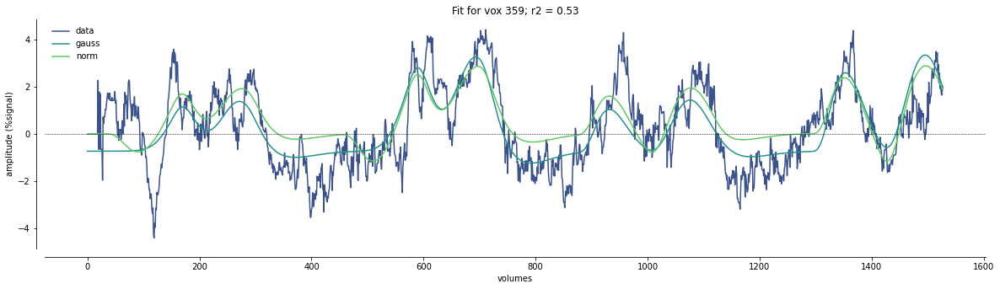

In [171]:
pars_gauss = gf_line.iterative_search_params[plot_vox,...]
pars_norm = gf_line_norm.iterative_search_params[0]

print(pars_gauss)
print(pars_norm)
data = gf_line.data[plot_vox,:]
pred_gauss = np.squeeze(gg_line.return_prediction(*pars_gauss[:-1]),0)
pred_norm = np.squeeze(gg_line_norm.return_prediction(*pars_norm[:-1]),0)
glm.plot_array([data,pred_gauss,pred_norm], 
            labels=["data", "gauss", "norm"], 
            x_label="volumes", 
            y_label="amplitude (%signal)",
            title=f"Fit for vox {plot_vox}; r2 = {round(pars[-1],2)}",
            figsize=(20,5),
            add_hline={'pos': 0 , 'color': 'k', 'lw': 0.5, 'ls': '--'})

[ 1.595 -0.55   0.96   0.005  0.     0.441]


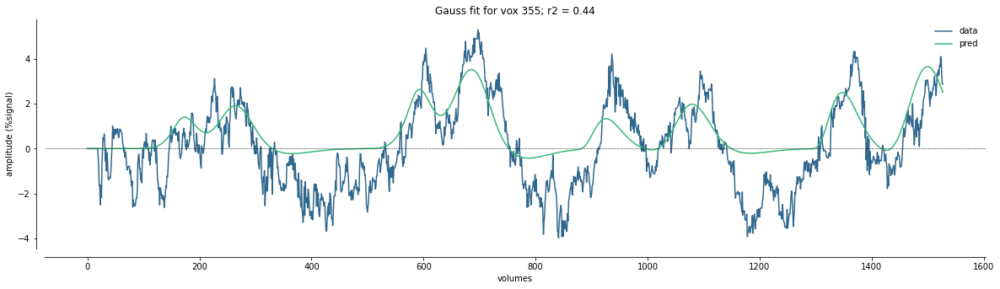

[ 2.251 -1.174  0.624  0.008  0.     0.349]


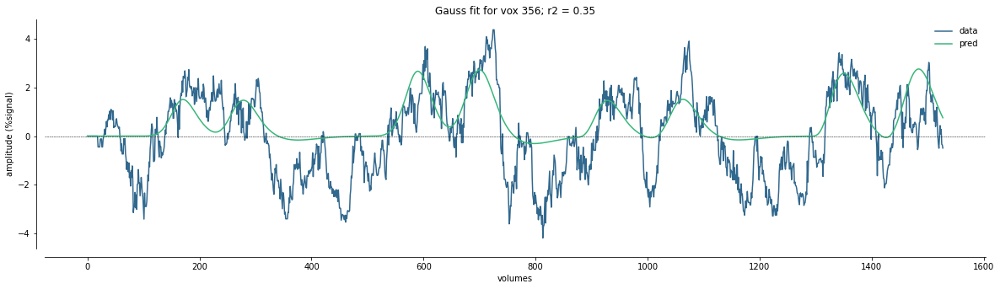

[ 1.529 -0.497  0.938  0.005  0.     0.468]


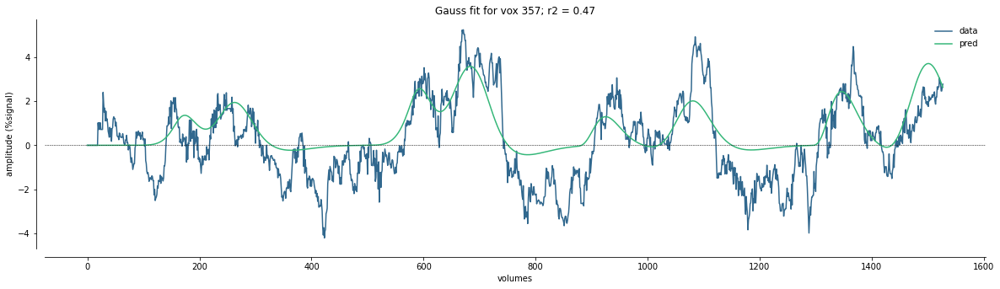

[ 2.426 -0.649  1.063  0.003  0.     0.305]


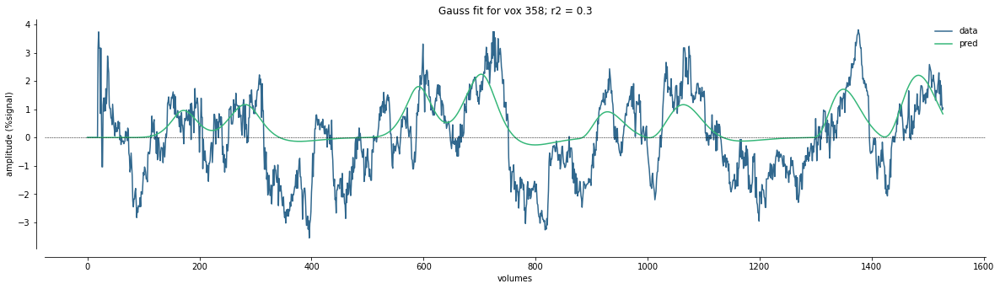

[ 1.767 -0.877  0.872  0.005  0.     0.423]


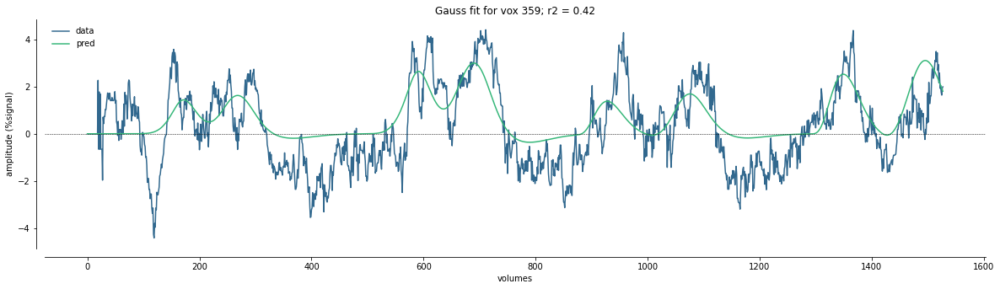

[ 1.221 -0.051  1.342  0.002  0.     0.239]


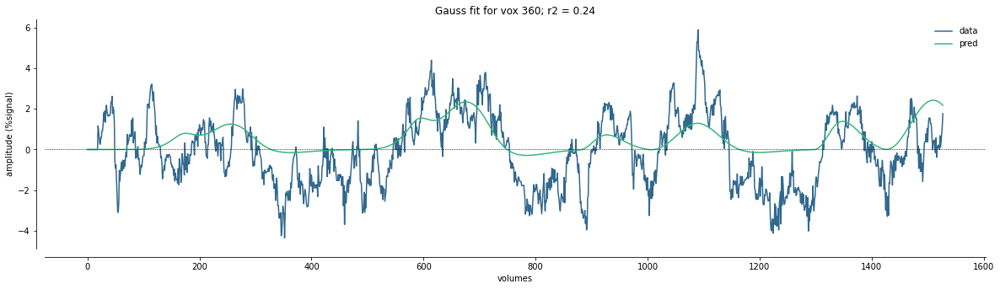

[ 1.703 -1.454  0.42   0.014  0.     0.322]


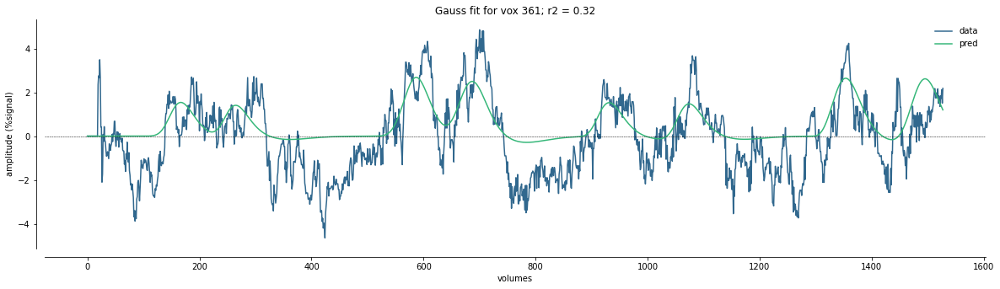

[ 1.824 -1.059  0.53   0.012  0.     0.426]


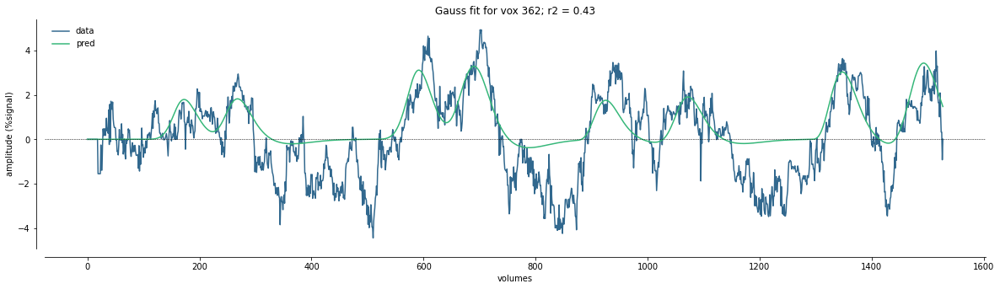

In [97]:
for ix, ii in enumerate(range(*ribbon)):
    
    pars = gf_line.iterative_search_params[ii]
    print(pars)
    data = gf_line.data[ii,:]
    pred = np.squeeze(gg_line.return_prediction(*pars[:-1]),0)
    glm.plot_array([data,pred], 
                labels=["data", "pred"], 
                x_label="volumes", 
                y_label="amplitude (%signal)",
                title=f"Gauss fit for vox {ii}; r2 = {round(pars[-1],2)}",
                figsize=(20,5),
                add_hline={'pos': 0 , 'color': 'k', 'lw': 0.5, 'ls': '--'})

In [56]:
iter_params = gf_line_norm.iterative_search_params
print(iter_params)

[[  1.803  -0.65    2.113   0.005   0.      0.      4.339  14.198   0.861
    0.484]
 [ 11.761  14.764  12.969  64.504   0.      0.622  13.854  14.298   0.162
    0.427]
 [  1.594  -0.728   1.574   0.032   0.      0.001   1.927  52.298   2.145
    0.49 ]
 [  4.131   0.892   1.427  57.248   0.      1.462   1.436   3.019   0.082
    0.351]
 [  2.002  -0.609   1.933   0.026   0.      0.001  37.345  22.337   5.175
    0.467]
 [  2.359   3.847   5.561   0.015   0.      0.      6.067  23.922   0.493
    0.291]
 [  2.122  -0.681   3.216   0.192   0.      0.008  38.97  243.561  25.598
    0.375]
 [  2.131  -0.072   3.439   0.004   0.      0.     23.493  38.448   0.945
    0.479]]


[ 1.803 -0.65   2.113  0.005  0.     0.     4.339 14.198  0.861  0.484]


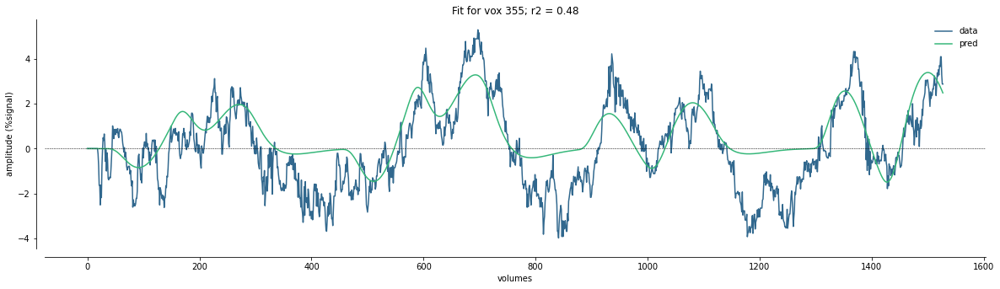

[11.761 14.764 12.969 64.504  0.     0.622 13.854 14.298  0.162  0.427]


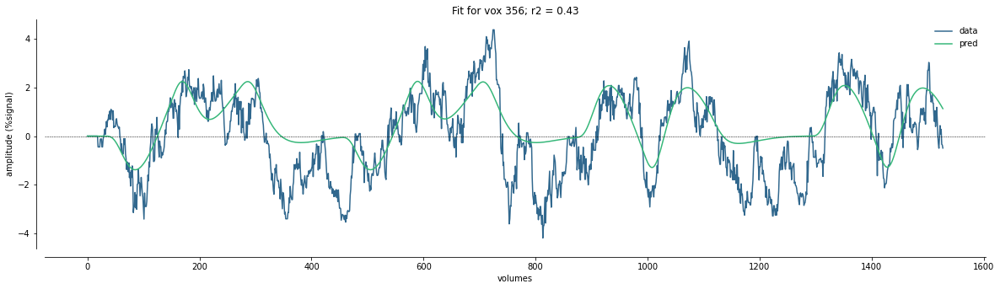

[ 1.594 -0.728  1.574  0.032  0.     0.001  1.927 52.298  2.145  0.49 ]


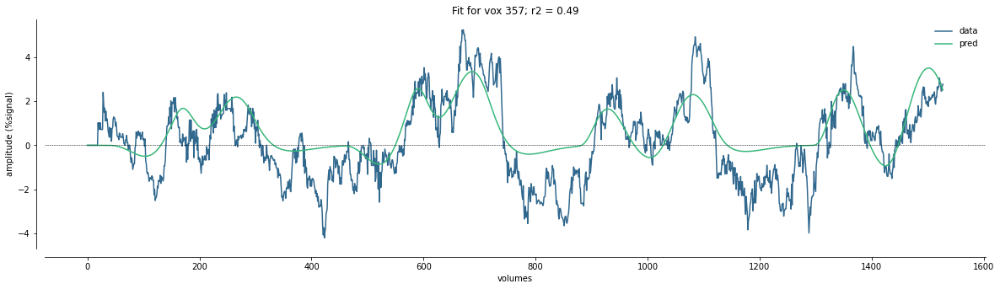

[ 4.131  0.892  1.427 57.248  0.     1.462  1.436  3.019  0.082  0.351]


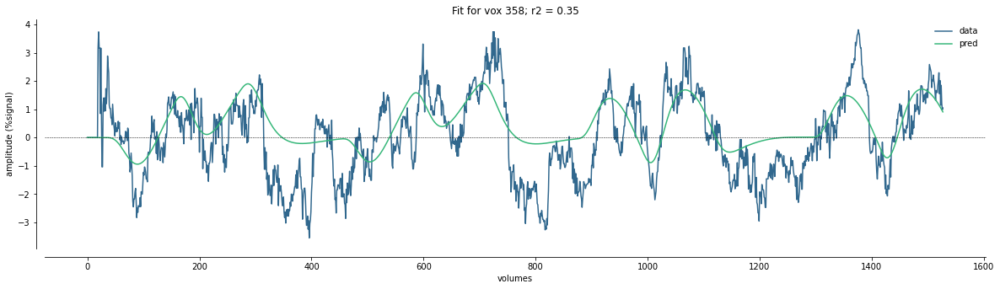

[ 2.002 -0.609  1.933  0.026  0.     0.001 37.345 22.337  5.175  0.467]


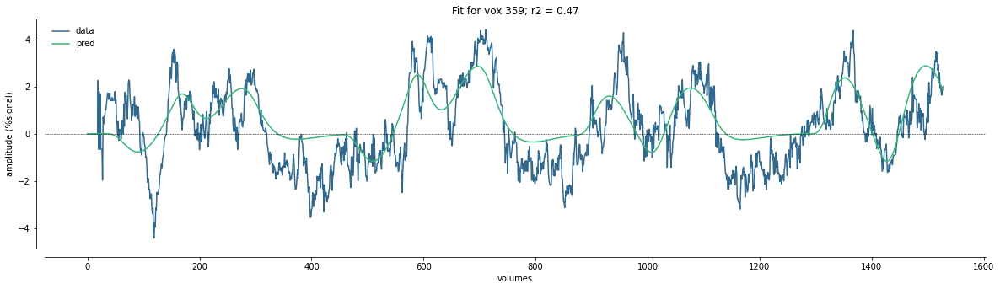

[ 2.359  3.847  5.561  0.015  0.     0.     6.067 23.922  0.493  0.291]


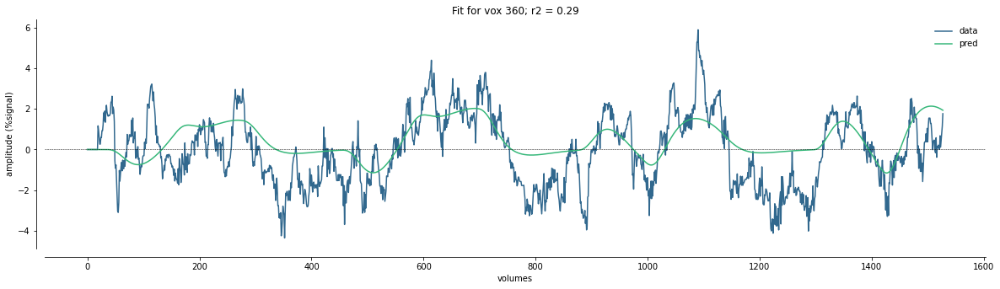

[  2.122  -0.681   3.216   0.192   0.      0.008  38.97  243.561  25.598
   0.375]


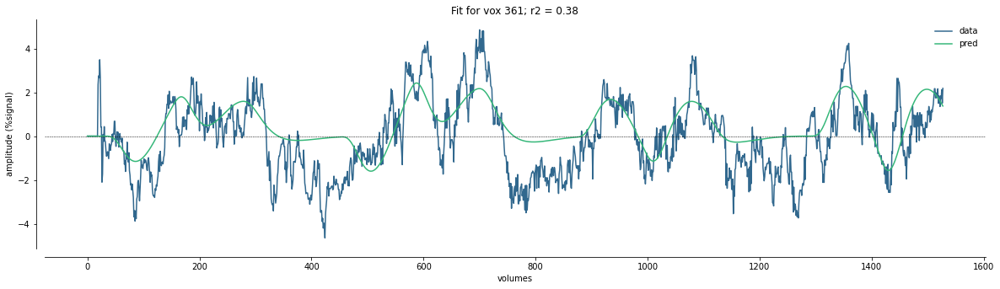

[ 2.131 -0.072  3.439  0.004  0.     0.    23.493 38.448  0.945  0.479]


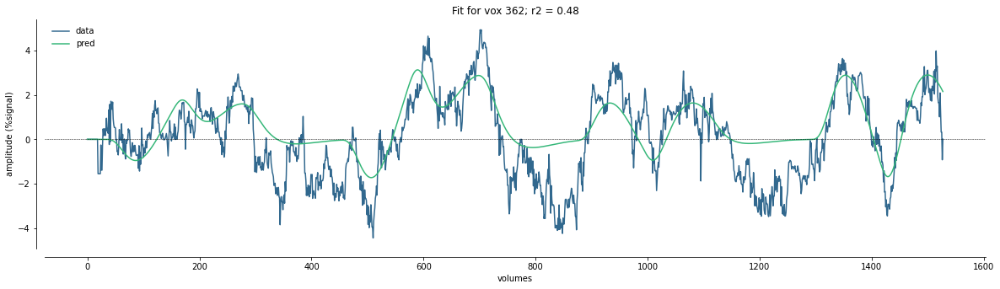

In [79]:
for ix, ii in enumerate(range(*ribbon)):
    
    pars = gf_line_norm.iterative_search_params[ix]
    print(pars)
    data = gf_line_norm.data[ix,:]
    pred = np.squeeze(gg_line_norm.return_prediction(*pars[:-1]),0)
    glm.plot_array([data,pred], 
                labels=["data", "pred"], 
                x_label="volumes", 
                y_label="amplitude (%signal)",
                title=f"Fit for vox {ii}; r2 = {round(pars[-1],2)}",
                figsize=(20,5),
                add_hline={'pos': 0 , 'color': 'k', 'lw': 0.5, 'ls': '--'})

(720, 6)


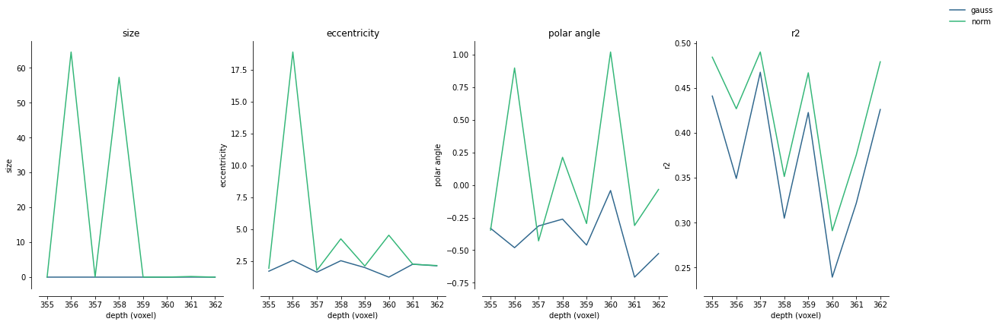

In [113]:
prf_pars_norm = gf_line_norm.iterative_search_params
prf_pars_gauss = gf_line.iterative_search_params
print(prf_pars_gauss.shape)

# calculate eccentricity & polar angle
pars = {}
for ii in ['gauss', 'norm']:
    pars[ii] = {}
    if ii == "gauss":
        use_pars = gf_line.iterative_search_params[ribbon[0]:ribbon[1],...]
    else:
        use_pars = gf_line_norm.iterative_search_params
        
    pars[ii]["r2"] = use_pars[...,-1]
    pars[ii]["ecc"] = np.sqrt(use_pars[...,0]**2+use_pars[...,1]**2)
    pars[ii]["polar"] = np.angle(use_pars[...,0]+use_pars[...,1]*1j)
    pars[ii]["size"] = use_pars[...,3]

# plot
fig,axs = plt.subplots(1,4, figsize=(20,6))
depth = np.arange(*ribbon)
colors = sns.color_palette('viridis', 2)

for ix,ii in enumerate(['gauss', 'norm']):

    axs[0].plot(depth, pars[ii]["size"], color=colors[ix], label=ii)
    axs[0].set_title("size")
    axs[0].set_xlabel("depth (voxel)")
    axs[0].set_ylabel("size")

    axs[1].plot(depth, pars[ii]["ecc"], color=colors[ix], label=ii)
    axs[1].set_title("eccentricity")
    axs[1].set_xlabel("depth (voxel)")
    axs[1].set_ylabel("eccentricity")

    axs[2].plot(depth, pars[ii]["polar"], color=colors[ix], label=ii)
    axs[2].set_title("polar angle")
    axs[2].set_xlabel("depth (voxel)")
    axs[2].set_ylabel("polar angle")

    axs[3].plot(depth, pars[ii]["r2"], color=colors[ix], label=ii)
    axs[3].set_title("r2")
    axs[3].set_xlabel("depth (voxel)")
    axs[3].set_ylabel("r2")

handles, labels = axs[3].get_legend_handles_labels()
fig.legend(handles, labels, frameon=False)
sns.despine(offset=10)

In [111]:
handles, labels = fig.get_legend_handles_labels()
handles

AttributeError: 'Figure' object has no attribute 'get_legend_handles_labels'

In [69]:
polar_expected = np.angle(params[0]+params[1]*1j)
ecc_expected = np.sqrt(params[0]**2+params[1]**2)

print(f"expected polar angle was: {round(polar_expected,2)}; got {round(polar[4],2)}")
print(f"expected eccentricity was: {round(ecc_expected,2)}; got {round(ecc[4],2)}")

expected polar angle was: -1.26; got -0.3
expected eccentricity was: 2.4; got 2.09


In [63]:
prf_pars

array([[  1.803,  -0.65 ,   2.113,   0.005,   0.   ,   0.   ,   4.339,
         14.198,   0.861,   0.484],
       [ 11.761,  14.764,  12.969,  64.504,   0.   ,   0.622,  13.854,
         14.298,   0.162,   0.427],
       [  1.594,  -0.728,   1.574,   0.032,   0.   ,   0.001,   1.927,
         52.298,   2.145,   0.49 ],
       [  4.131,   0.892,   1.427,  57.248,   0.   ,   1.462,   1.436,
          3.019,   0.082,   0.351],
       [  2.002,  -0.609,   1.933,   0.026,   0.   ,   0.001,  37.345,
         22.337,   5.175,   0.467],
       [  2.359,   3.847,   5.561,   0.015,   0.   ,   0.   ,   6.067,
         23.922,   0.493,   0.291],
       [  2.122,  -0.681,   3.216,   0.192,   0.   ,   0.008,  38.97 ,
        243.561,  25.598,   0.375],
       [  2.131,  -0.072,   3.439,   0.004,   0.   ,   0.   ,  23.493,
         38.448,   0.945,   0.479]])

In [91]:
params_fn = utils.get_file_from_substring("best_vertices", opj(base_dir, 'derivatives', 'pycortex', f"sub-{sub}"))
if os.path.exists(params_fn):
    params_df = utils.VertexInfo(params_fn)
    params = params_df.get('prf', hemi='L')
else:
    params = np.array([2.283,-0.742,1.039,0.189,-0.163,0.01,18.,0.189,1.,0.745])

params_line = prf_pars[1,...]
print(f"wb params:   {[round(i,2) for i in params]}")
print(f"line params: {params_line}")

wb params:   [0.74, -2.28, 0.44, 0.0, -0.22, 0.74]
line params: [11.761 14.764 12.969 64.504  0.     0.622 13.854 14.298  0.162  0.427]


In [102]:
np.where(np.arange(*ribbon) == 359)[0][0]

4

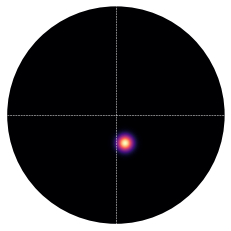

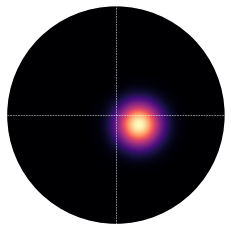

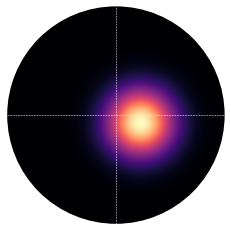

In [137]:
gauss_params = gf_line.iterative_search_params[359,...]

vox_idx = np.where(np.arange(*ribbon) == 359)[0][0]
norm_params = gf_line_norm.iterative_search_params[vox_idx,:]

prf_wb = prf.make_prf(prf_stim, size=params[2], mu_x=params[0], mu_y=params[1])
prf_wb_ax = prf.plot_prf(prf_wb, vf_extent, return_axis=True) #, save_as=opj(fig_dir, 'sub-003_wb_prf.svg'))

prf_line_gauss = prf.make_prf(prf_stim, size=gauss_params[2], mu_x=gauss_params[0], mu_y=gauss_params[1])
prf_line_gauss_ax = prf.plot_prf(prf_line_gauss, vf_extent, return_axis=True) #, save_as=opj(fig_dir, 'sub-003_line_prf.svg'))

prf_line_norm = prf.make_prf(prf_stim, size=norm_params[2], mu_x=norm_params[0], mu_y=norm_params[1])
prf_line_norm_ax = prf.plot_prf(prf_line_norm, vf_extent, return_axis=True) #, save_as=opj(fig_dir, 'sub-003_line_prf.svg'))

---
# Size response curves

In [ ]:
%reload_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
import nideconv as nd
from nideconv import simulate
import nibabel as nb
from prfpy import *
from linescanning import *
from linescanning import glm,image,prf
import scipy as sp
from scipy.io import loadmat
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import os
import yaml

opj = os.path.join
base, place = utils.get_base_dir()

base_dir = opj(base, 'projects', 'hemifield')
fig_dir = opj(base_dir, 'code', 'figures', 'prf')


In [ ]:
# simulate data
# define stimulus design
# perform analysis as normal
# update stimulus design

In [ ]:
design_fn = utils.get_file_from_substring("vis_design.mat", opj(base_dir, 'derivatives', 'prf', 'sub-007'))
print(design_fn)

if os.path.exists(design_fn):
    design_matrix = loadmat(design_fn)
    print(f"Shape dm = {design_matrix['stim'].shape}")

    params = np.array([2.283,-0.742,1.039,0.189,-0.163,0.01,18.,0.189,1.,0.745])
    print(f"Params = {params}")
else:
    raise ValueError(f"Could not find {design_fn}")


/data1/projects/MicroFunc/Jurjen/projects/hemifield/derivatives/prf/sub-007/vis_design.mat
Shape dm = (270, 270, 225)
Params = [ 2.283 -0.742  1.039  0.189 -0.163  0.01  18.     0.189  1.     0.745]


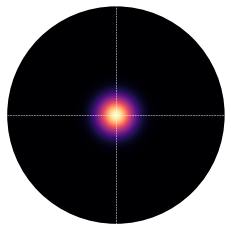

In [ ]:
vf_extent = [-5, 5]
prf_stim = stimulus.PRFStimulus2D(screen_size_cm=70, screen_distance_cm=225, design_matrix=design_matrix['stim'],TR=1.5)

prf_array = prf.make_prf(prf_stim, size=params[2])
prf.plot_prf(prf_array, vf_extent)


In [ ]:
# starting stimulus design
design_matrix = loadmat(opj(base_dir, 'derivatives', 'prf', 'sub-005', 'vis_design.mat'))

# define model
gg = model.Norm_Iso2DGaussianModel(stimulus=prf_stim,
                                   filter_predictions=False,
                                   filter_type='sg',
                                   filter_params={'window_length': 300, 'polyorder': 1})

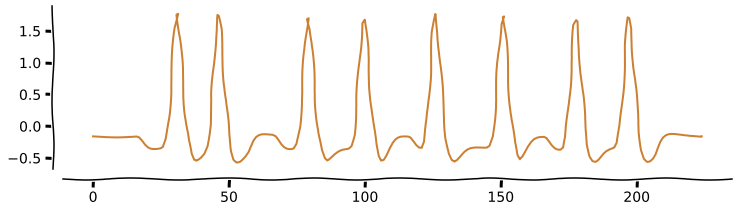

In [ ]:
x = np.squeeze(gg.return_prediction(*params).T)
glm.plot_array(x, xkcd=True)

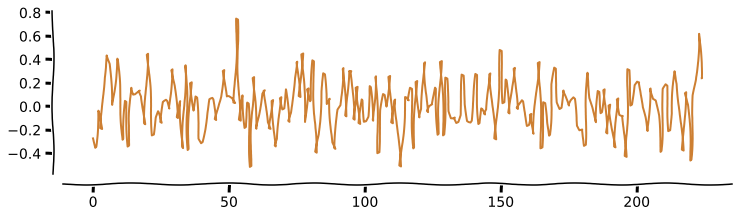

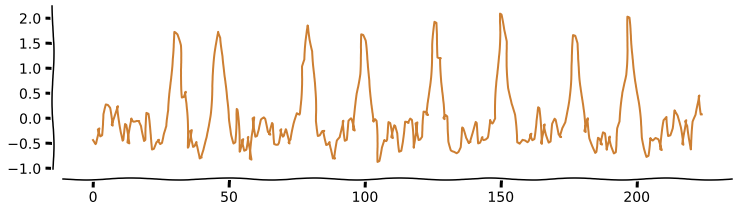

In [ ]:
# add noise to data
noise = np.random.normal(0, 0.2, x.shape[0])
glm.plot_array(noise, xkcd=True)
synth_fmri = x+noise
glm.plot_array(synth_fmri, xkcd=True)

max tstat (vox 0) = 44.2
max beta (vox 0) = 1.02


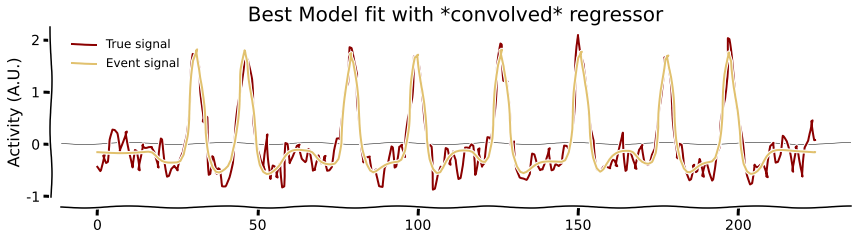

In [ ]:
# get fit
betas,x_conv = glm.fit_first_level(x, synth_fmri, make_figure=True, xkcd=True)

In [ ]:
synth_fmri.shape

(225,)

# Actually simulate with nideconv

In [ ]:
# # get peaks for onset times
# peaks, _ = sp.signal.find_peaks(x, height=0)
# onsets_tr = list(peaks-5)

# with plt.xkcd():
#     fig = plt.figure(figsize=(12,3))
#     plt.plot(x)
#     plt.plot(peaks, x[peaks], "x")
#     sns.despine(offset=10)

#     for ii in onsets_tr:
#         plt.axvline(ii, color='r')
#     plt.show()


In [ ]:
# onsets_sec = [i*1.5 for i in onsets]
# onsets_sec

In [ ]:
# stim_pars = {'name': 'stim',
#              'mu_group': 1.5,  # Positive response for stimulus presentation
#              'std_group': 0,
#              'onsets': onsets_tr}

# conditions = [stim_pars]

# data, onsets, parameters = simulate.simulate_fmri_experiment(conditions,
#                                                              run_duration=x.shape[0],
#                                                              noise_level=0.05)

# glm.plot_array([data,x], xkcd=True)


---
# Fit model to synthetic BOLD

In [ ]:
gf = fit.Norm_Iso2DGaussianFitter(gg, synth_fmri[...,np.newaxis].T)
old_params = np.array((*params[:3], params[-1]))[np.newaxis,...]
old_params.shape


(1, 4)

In [ ]:
surround_amplitude_grid = np.array([0.01, 0.1, 1, 10], dtype='float32')
surround_size_grid=np.array([5,8,12,18], dtype='float32')
neural_baseline_grid=np.array([0,1,10,100], dtype='float32')
surround_baseline_grid=np.array([0.1,1.0,10.0,100.0], dtype='float32')

#################################################################################################################
# # Uncomment to rerun gridsearch
# # ~250s
# gf.grid_fit(surround_amplitude_grid, surround_size_grid, neural_baseline_grid,
#             surround_baseline_grid, gaussian_params=old_params, n_batches=1)
#
# new_params = gf.gridsearch_params[0]
#################################################################################################################


In [ ]:
new_params = np.array([2.283, -0.742, 1.039,  0.175, -0.17, 0.01, 12, 0.175,  1, 0.909])

print(f"params = {new_params}")
new_prediction = gg.return_prediction(*new_params[:-1]).T
X_prf = new_params[0]
Y_prf = new_params[1]
A = new_params[3]
B = new_params[-3]/new_params[3]
C = new_params[5]
D = new_params[-2]
ss = new_params[6]
r2 = new_params[-1]
prf_size = new_params[2]
norm = ss/A

print(f'X                       = {round(X_prf,2)}')
print(f'Y                       = {round(Y_prf,2)}')
print(f'A (prf amplitude/beta)  = {round(A,2)}')
print(f'B (neural baseline)     = {round(B,2)}')
print(f'C (surround amplitude)  = {round(C,2)}')
print(f'D (surround baseline)   = {round(D,2)}')
print(f'R2                      = {round(r2,2)}')
print(f'Surround size           = {ss}')
print(f'pRF size                = {round(prf_size,2)}')
print(f'Size ratio (phi)        = {round(ss/A,2)}')

params = [ 2.283 -0.742  1.039  0.175 -0.17   0.01  12.     0.175  1.     0.909]
X                       = 2.28
Y                       = -0.74
A (prf amplitude/beta)  = 0.18
B (neural baseline)     = 1.0
C (surround amplitude)  = 0.01
D (surround baseline)   = 1.0
R2                      = 0.91
Surround size           = 12.0
pRF size                = 1.04
Size ratio (phi)        = 68.57


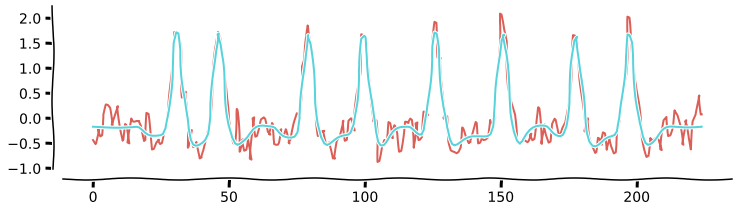

In [ ]:
glm.plot_array([synth_fmri,new_prediction], xkcd=True)


---
# Size/response curves?

In [ ]:
dim_stim = 2
bar_stim = False
center_prfs = True
plot_data = False
plot_curves = True
resp_measure = 'Max (model-based)'
normalize_response = True
confint = True
n_pix = prf_stim.design_matrix.shape[0]

center = np.flip(np.squeeze(np.array(np.where(prf == np.amax(prf))[1:])))
center = [n_pix//2,n_pix//2]
print(f"Center of pRF = {center}")

ss_deg = 3.0 * np.degrees(np.arctan(prf_stim.screen_size_cm /(2.0*prf_stim.screen_distance_cm)))

x = np.linspace(-ss_deg/2, ss_deg/2, n_pix)
dx = prf_stim.design_matrix.shape[0]/len(x)

Center of pRF = [135, 135]


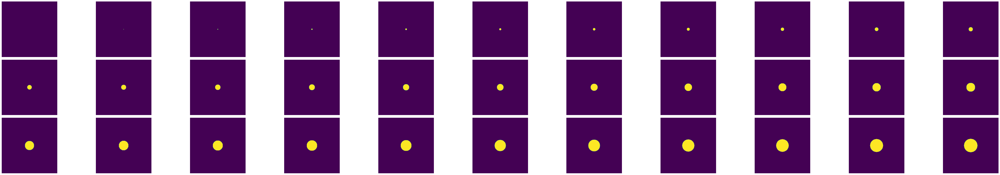

In [ ]:
# create filled stimuli
stims_fill, stims_fill_sizes = prf.make_stims(n_pix, prf_stim, factr=4)
prf.plot_stims(stims_fill)

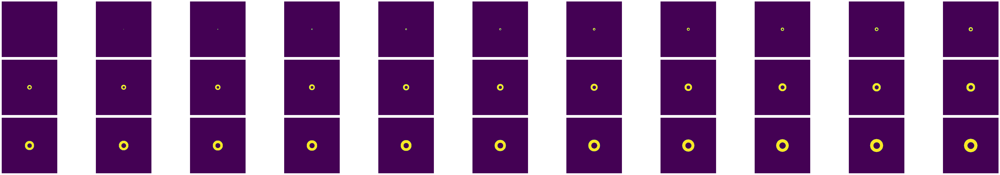

In [ ]:
stims_conc, stims_fill_conc = prf.make_stims(n_pix, prf_stim, concentric=True, concentric_size=0.5)
prf.plot_stims(stims_conc)


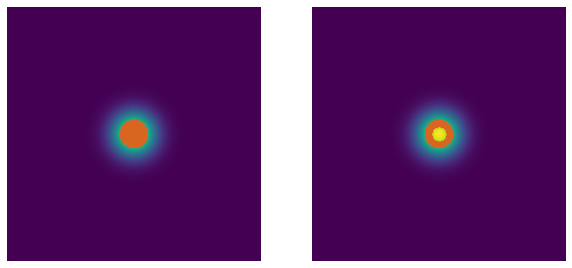

In [ ]:
# confirm location of stims
from linescanning.utils import make_binary_cm
fig,axs = plt.subplots(1,2, figsize=(10,10))
cmap = make_binary_cm(216, 102, 32)
axs[0].imshow(np.squeeze(prf_array))
axs[0].imshow(stims_fill[15], cmap=cmap)
axs[0].axis('off')

axs[1].imshow(np.squeeze(prf_array))
axs[1].imshow(stims_conc[15], cmap=cmap)
axs[1].axis('off')

plt.show()


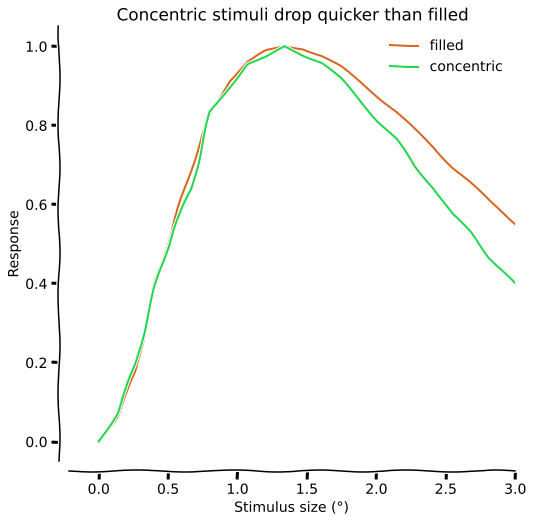

In [ ]:
mean_srf_fill = prf.norm_2d_sr_function(A, B, C, D, prf_size, ss, x, x, stims_fill, mu_x=0, mu_y=0)
mean_srf_fill /= mean_srf_fill.max()

mean_srf_conc = prf.norm_2d_sr_function(A, B, C, D, prf_size, ss, x, x, stims_conc, mu_x=0, mu_y=0)
mean_srf_conc /= mean_srf_conc.max()

with plt.xkcd():
    fig = plt.figure(figsize=(8,8))
    plt.plot(stims_fill_sizes, mean_srf_fill, color=(216/255, 102/255, 32/255), label='filled')
    plt.plot(stims_fill_conc, mean_srf_conc, color=(32/255, 216/255, 77/255), label='concentric')
    plt.title("Concentric stimuli drop quicker than filled")
    plt.ylabel("Response")
    plt.xlabel("Stimulus size (°)")
    plt.xlim(right=3)
    plt.legend(frameon=False)
    sns.despine(offset=10)

use following stimulus sizes: [0.67, 1.21, 1.27, 1.34, 2.81]


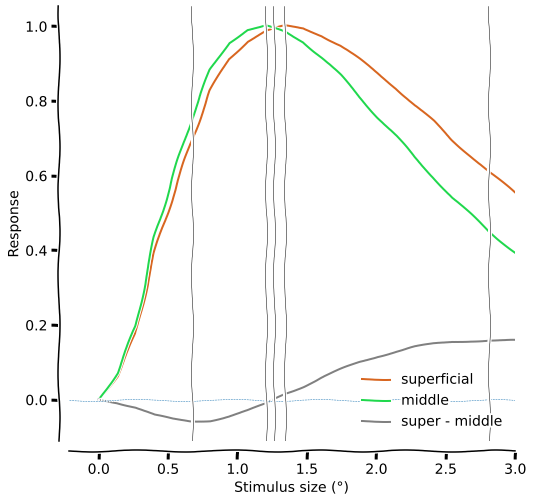

In [ ]:
# compare S-R curves when pRF size differs (as is supposed to happen across laminae)
from scipy.signal import find_peaks

# 1. Obtained pRF is pooled variance across layers, so middle layer is X% smaller
prf_size_L4 = prf_size*0.8

mean_srf_sup = prf.norm_2d_sr_function(A, B, C, D, prf_size, ss, x, x, stims_fill, mu_x=0, mu_y=0)
mean_srf_sup /= mean_srf_sup.max()

mean_srf_middle = prf.norm_2d_sr_function(A, B, C, D, prf_size_L4, ss, x, x, stims_fill, mu_x=0, mu_y=0)
mean_srf_middle /= mean_srf_middle.max()

# find peaks and max differences
sr_diff = mean_srf_sup-mean_srf_middle
choose_sizes = find_peaks(abs(sr_diff))[0]
choose_sizes = np.append(choose_sizes, 
                         np.array((
                             np.where(mean_srf_sup == np.amax(mean_srf_sup))[0][0],
                             np.where(mean_srf_middle == np.amax(mean_srf_middle))[0][0])))

# # find intersection
from shapely.geometry import LineString

first_line = LineString(np.column_stack((stims_fill_sizes, mean_srf_sup)))
second_line = LineString(np.column_stack((stims_fill_sizes, mean_srf_middle)))
intersection = first_line.intersection(second_line)

x_size, y_size = LineString(intersection).xy[0]

# visualize
with plt.xkcd():
    fig = plt.figure(figsize=(8,8))
    plt.plot(stims_fill_sizes, mean_srf_sup, color=(216/255, 102/255, 32/255), label='superficial')
    plt.plot(stims_fill_sizes, mean_srf_middle, color=(32/255, 216/255, 77/255), label='middle')
    plt.plot(stims_fill_sizes, sr_diff, color=(128/255, 128/255, 128/255), label='super - middle')
    plt.axhline(0, lw=0.5, ls='--')
    # plt.title("Concentric stimuli drop quicker than filled")
    plt.ylabel("Response")
    plt.xlabel("Stimulus size (°)")
    plt.xlim(right=3)
    plt.legend(frameon=False)
    sns.despine(offset=10)

    use_stim_sizes = []
    for ii in choose_sizes:
        plt.axvline(stims_fill_sizes[ii], color='k', lw=0.5)
        use_stim_sizes.append(stims_fill_sizes[ii])

    # plot intersection
    plt.axvline(y_size, color='k', lw=0.5)
    use_stim_sizes.append(y_size)

use_stim_sizes.sort()
use_stim_sizes = [round(ii,2) for ii in use_stim_sizes]

print(f"use following stimulus sizes: {use_stim_sizes}")

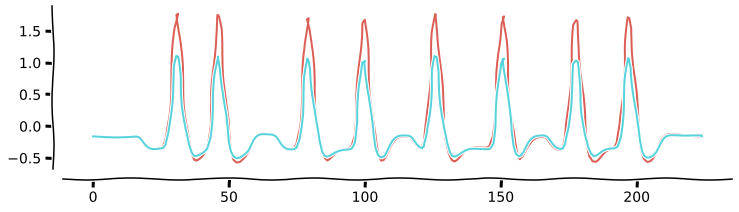

In [ ]:
x1 = np.squeeze(gg.return_prediction(*params).T)

params_middle = np.copy(params)
params_middle[2] = prf_size_L4

x2 = np.squeeze(gg.return_prediction(*params_middle).T)
glm.plot_array([x1,x2], xkcd=True)

compare = [x1,
           x1+np.random.normal(0, 0.2, x1.shape[0]), 
           x2, 
           x2+np.random.normal(0, 0.2, x2.shape[0])]

Variance large pRF & good fit = 0.39
Variance large pRF & bad fit  = 0.31
Variance small pRF & good fit = 0.41
Variance small pRF & bad fit  = 0.33


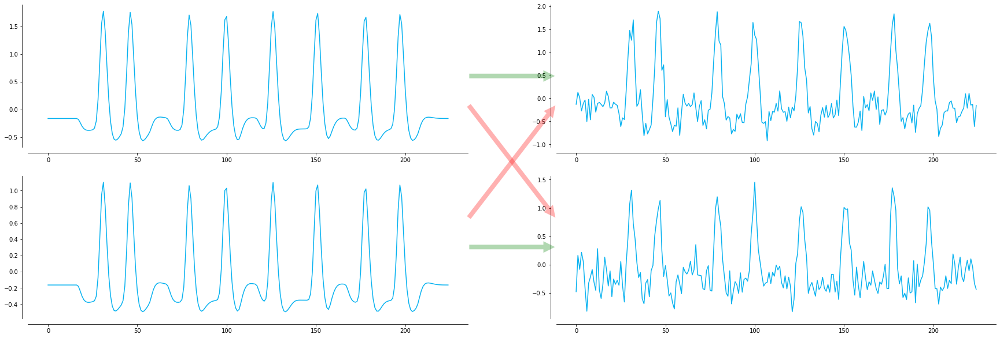

In [ ]:
fig,axs = plt.subplots(2,2, figsize=(30,10))

for i, ax in enumerate(fig.axes):
    ax.plot(compare[i], color=(8/255,178/255,240/255))
    sns.despine(offset=10)
    # ax.axis('off')

var_arr = np.array(compare)
var_prfs = [np.var(var_arr[:1,:]),
            np.var(var_arr[[0,-1],:]),
            np.var(var_arr[:-2,:]),
            np.var(var_arr[[1,-1],:])
            ]
print(f"Variance large pRF & good fit = {round(var_prfs[0],2)}")
print(f"Variance large pRF & bad fit  = {round(var_prfs[1],2)}")
print(f"Variance small pRF & good fit = {round(var_prfs[2],2)}")
print(f"Variance small pRF & bad fit  = {round(var_prfs[3],2)}")

# Create the arrow
# 1. Get transformation operators for axis and figure
ax0tr = axs[0][0].transData # Axis 0 -> Display
ax1tr = axs[0][1].transData # Axis 1 -> Display
figtr = fig.transFigure.inverted() # Display -> Figure
# 2. Transform arrow start point from axis 0 to figure coordinates
ptB = figtr.transform(ax0tr.transform((1, 0.5)))
# 3. Transform arrow end point from axis 1 to figure coordinates
ptE = figtr.transform(ax1tr.transform((0, 0.5)))
# 4. Create the patch
arrow = patches.FancyArrowPatch(
    ptB, ptE, transform=fig.transFigure,  # Place arrow in figure coord system
    fc="g", ec='none', connectionstyle="Arc3", arrowstyle='simple', alpha=0.3,
    mutation_scale=40.
)
# 5. Add patch to list of objects to draw onto the figure
fig.patches.append(arrow)

# Create the arrow
# 1. Get transformation operators for axis and figure
ax0tr = axs[1][0].transData # Axis 0 -> Display
ax1tr = axs[1][1].transData # Axis 1 -> Display
figtr = fig.transFigure.inverted() # Display -> Figure
# 2. Transform arrow start point from axis 0 to figure coordinates
ptB = figtr.transform(ax0tr.transform((1, 0.5)))
# 3. Transform arrow end point from axis 1 to figure coordinates
ptE = figtr.transform(ax1tr.transform((0, 0.5)))
# 4. Create the patch
arrow = patches.FancyArrowPatch(
    ptB, ptE, transform=fig.transFigure,  # Place arrow in figure coord system
    fc="g", ec='none', connectionstyle="Arc3", arrowstyle='simple', alpha=0.3,
    mutation_scale=40.
)
# 5. Add patch to list of objects to draw onto the figure
fig.patches.append(arrow)

# Create the arrow
# 1. Get transformation operators for axis and figure
ax0tr = axs[1][0].transData # Axis 0 -> Display
ax1tr = axs[0][1].transData # Axis 1 -> Display
figtr = fig.transFigure.inverted() # Display -> Figure
# 2. Transform arrow start point from axis 0 to figure coordinates
ptB = figtr.transform(ax0tr.transform((1, 0.7)))
# 3. Transform arrow end point from axis 1 to figure coordinates
ptE = figtr.transform(ax1tr.transform((0, 0.3)))
# 4. Create the patch
arrow = patches.FancyArrowPatch(
    ptB, ptE, transform=fig.transFigure,  # Place arrow in figure coord system
    fc="r", ec='none', connectionstyle="Arc3", arrowstyle='simple', alpha=0.3,
    mutation_scale=40.
)
# 5. Add patch to list of objects to draw onto the figure
fig.patches.append(arrow)

# Create the arrow
# 1. Get transformation operators for axis and figure
ax0tr = axs[0][0].transData # Axis 0 -> Display
ax1tr = axs[1][1].transData # Axis 1 -> Display
figtr = fig.transFigure.inverted() # Display -> Figure
# 2. Transform arrow start point from axis 0 to figure coordinates
ptB = figtr.transform(ax0tr.transform((1, 0.3)))
# 3. Transform arrow end point from axis 1 to figure coordinates
ptE = figtr.transform(ax1tr.transform((0, 0.7)))
# 4. Create the patch
arrow = patches.FancyArrowPatch(
    ptB, ptE, transform=fig.transFigure,  # Place arrow in figure coord system
    fc="r", ec='none', connectionstyle="Arc3", arrowstyle='simple', alpha=0.3,
    mutation_scale=40.
)
# 5. Add patch to list of objects to draw onto the figure
fig.patches.append(arrow)

In [ ]:
def get_prediction_prf_size(params, model_dict, size=1, noise_level=0.8, add_noise=True):

    new_params = np.copy(params)
    new_params[2] = size

    ts = np.squeeze(model_dict.return_prediction(*new_params).T)
    noise = np.random.normal(0, noise_level, ts.shape[0])

    if add_noise:
        return ts+noise
    else:
        return ts

range_size = np.arange(0.4,4.1,step=0.1)
perc_diff = 0.3
n_frames = gg.stimulus.design_matrix.shape[-1]

pred_prf_large = np.zeros((n_frames, len(range_size)))
pred_prf_small = np.zeros((n_frames, len(range_size)))
noise_prf_large = np.zeros((n_frames, len(range_size)))
noise_prf_small = np.zeros((n_frames, len(range_size)))
for ix,ii in enumerate(range_size):

    ts_large = get_prediction_prf_size(params, gg, size=ii, add_noise=False)
    ts_small = get_prediction_prf_size(params, gg, size=ii*(1-perc_diff), add_noise=False)

    pred_prf_large[:,ix] = ts_large
    pred_prf_small[:,ix] = ts_small

    ts_large = get_prediction_prf_size(params, gg, size=ii, add_noise=True)
    ts_small = get_prediction_prf_size(params, gg, size=ii*(1-perc_diff), add_noise=True)

    noise_prf_large[:,ix] = ts_large
    noise_prf_small[:,ix] = ts_small

pred_prf_large.astype(np.float)
pred_prf_small.astype(np.float)
noise_prf_large.astype(np.float)
noise_prf_small.astype(np.float)    

array([[-0.482, -0.681, -0.606, ...,  1.061, -0.62 ,  1.623],
       [ 0.509,  0.521, -0.907, ..., -0.847, -0.112,  0.316],
       [-0.222,  1.085, -1.087, ...,  0.557, -0.439, -0.059],
       ...,
       [ 0.581, -0.156,  0.349, ..., -0.042,  0.467,  0.094],
       [ 0.067, -1.147, -0.062, ...,  0.889,  1.154,  0.222],
       [-0.991,  0.727, -1.385, ..., -0.658, -0.73 ,  0.378]])

In [ ]:
# https://thepythongeek.medium.com/covariance-correlation-and-r-squared-explained-with-python-df1d52bfa44b
def calc_r2(data,pred):

    """Calculate explained variance of predictor on data"""

    SSE = np.sum((data-pred)**2)
    SST = np.sum((data-data.mean())**2)
    R_squared = (SST-SSE)/SST

    return R_squared

vars_sizes = np.zeros((len(range_size), 4))
for ix,ii in enumerate(range_size):

    good_fit_large = calc_r2(noise_prf_large[:,ix], pred_prf_large[:,ix])
    bad_fit_large = calc_r2(noise_prf_small[:,ix], pred_prf_large[:,ix])
    good_fit_small = calc_r2(noise_prf_small[:,ix], pred_prf_small[:,ix])
    bad_fit_small = calc_r2(noise_prf_large[:,ix], pred_prf_small[:,ix])

    vars_sizes[ix,:] = np.array((good_fit_large, bad_fit_large, good_fit_small, bad_fit_small))

print(vars_sizes.shape)
print(np.mean(vars_sizes, axis=0))

(37, 4)
[0.715 0.016 0.575 0.466]


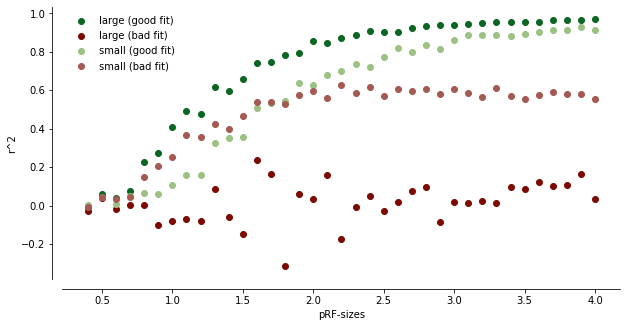

In [ ]:
# https://stackoverflow.com/questions/19068862/how-to-overplot-a-line-on-a-scatter-plot-in-python/19069001#19069001
fig,axs = plt.subplots(figsize=(10,5))

axs.scatter(range_size, vars_sizes[:,0], color="#0B6623", label='large (good fit)')
axs.scatter(range_size, vars_sizes[:,1], color="#7C0A02", label='large (bad fit)')
axs.scatter(range_size, vars_sizes[:,2], color="#9DC183", label='small (good fit)')
axs.scatter(range_size, vars_sizes[:,3], color="#A45A52", label='small (bad fit)')
axs.legend(frameon=False, loc='best')
axs.set_xlabel('pRF-sizes')
axs.set_ylabel('r^2')
sns.despine(offset=10)

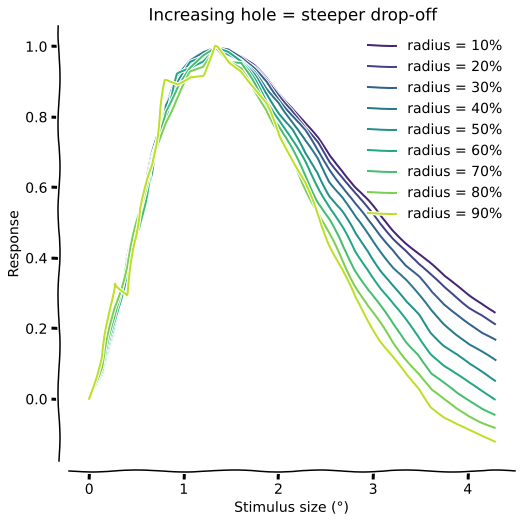

In [ ]:
# create concentric stimuli
stim_dict,size_dict,sr_dict = {},{},{}

conc_radii = np.arange(10,100, step=10)
for ix,ii in enumerate(conc_radii):
    stim_dict[ix],size_dict[ix] = prf.make_stims(n_pix, prf_stim, concentric=True, concentric_size=(ii/100))
    sr_dict[ix] = prf.norm_2d_sr_function(A, B, C, D, prf_size, ss, x, x, stim_dict[ix], mu_x=0, mu_y=0)
    sr_dict[ix] /= sr_dict[ix].max()


cols = sns.color_palette('viridis', len(stim_dict))
with plt.xkcd():
    fig = plt.figure(figsize=(8,8))

    for ix,ii in enumerate(conc_radii):
        plt.plot(size_dict[ix], sr_dict[ix], color=cols[ix], label=f'radius = {conc_radii[ix]}%')
        plt.ylabel("Response")
        plt.title("Increasing hole = steeper drop-off")
        plt.xlabel("Stimulus size (°)")
        plt.legend(frameon=False)
        # plt.xlim(right=3)
        sns.despine(offset=10)


size = 4.286940392820204


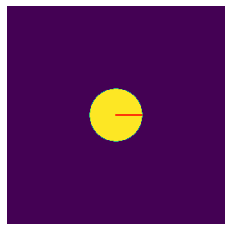

In [ ]:
print(f"size = {stims_fill_sizes[-1]}")
rad = prf.radius(stims_fill[-1])
plt.imshow(stims_fill[-1])
start = (270//2)/270
plt.axhline((270//2), xmin=start, xmax=((270//2)+rad)/270, color='r')
plt.axis('off')
plt.show()


In [ ]:
diameter = prf.radius(stims_fill[-1])*2

print(f"orig deg                    = {round(stims_fill_sizes[-1],2)}")
print(f"pix2deg with pixel diameter = {round(prf.pix2deg(diameter, prf_stim),2)}")

print(f"orig pix                    = {diameter}")
print(f"deg2pix with visual angle   = {prf.deg2pix(stims_fill_sizes[-1], prf_stim)}")


orig deg                    = 4.29
pix2deg with pixel diameter = 4.29
orig pix                    = 65.0
deg2pix with visual angle   = 65.0


In [ ]:
# can we make bars with visual degrees?

prf_object = prf_stim

ss_deg = 2.0 * np.degrees(np.arctan(prf_object.screen_size_cm /(2.0*prf_object.screen_distance_cm)))
x = np.linspace(-ss_deg/2, ss_deg/2, n_pix)

if dim_stim == 1:
    stims = [np.zeros_like(n_pix) for n in range(int(n_pix/4))]
else:
    factr=4
    stims = [np.zeros((n_pix, n_pix)) for n in range(int(n_pix/(2*factr)))]
    stim_sizes=[]

for pp, stim in enumerate(stims):
    
    if dim_stim == 1:
        #2d rectangle or 1d
        stim[int(stim.shape[0]/2)-pp:int(stim.shape[0]/2)+pp] = 1
    else:
        #2d circle
        xx,yy = np.meshgrid(x,x)
        stim[((xx**2+yy**2)**0.5)<(x.max()*pp/(len(stims)*factr))] = 1
        stim_sizes.append(2*(x.max()*pp/(len(stims)*factr)))

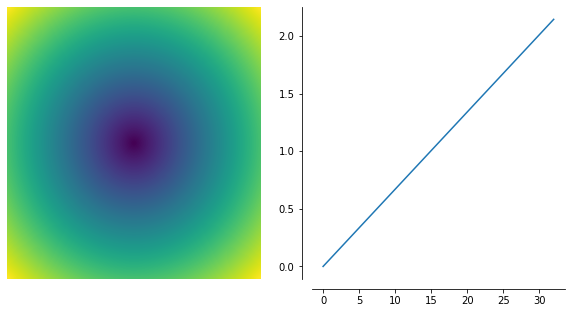

In [ ]:
fig,axs = plt.subplots(1,2, figsize=(10,5))
grid = (xx**2+yy**2)**0.5

axs[0].imshow(grid, aspect="auto")
axs[0].axis('off')

axs[1].plot(x.max()*range(33)/(len(stims)*factr))

sns.despine(offset=10)
plt.show()


In [ ]:
max_ix = int(np.where(mean_srf_fill == np.amax(mean_srf_fill))[0])
max_deg = stims_fill_sizes[max_ix]
max_pix = int(prf.deg2pix(max_deg, prf_stim))

print(f"max visual degree = {max_deg}")
print(f"max visual pixels = {max_pix}")


max visual degree = 1.339668872756314
max visual pixels = 20


---
# Create library of stimuli

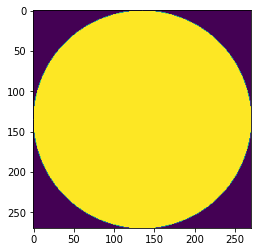

In [ ]:
aperture = prf.create_circular_mask(n_pix,n_pix)
plt.imshow(aperture)

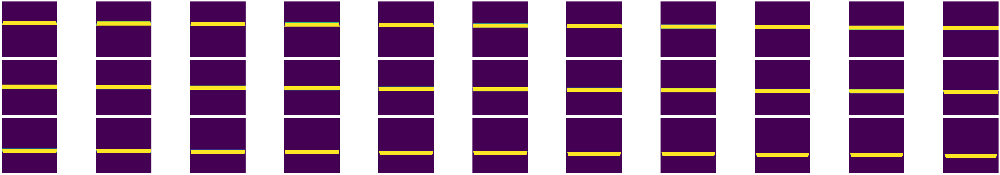

In [ ]:
beam_locations = np.linspace(n_pix//2-40,n_pix//2+40,num=33).astype(int)

horizontal = [np.zeros((n_pix, n_pix)) for n in beam_locations]

for pp, stim in enumerate(horizontal):

    total = beam_locations[pp]+max_pix

    if total <= n_pix:
        stim[beam_locations[pp]:beam_locations[pp]+max_pix,:] = 1
    else:
        remains = total - n_pix
        stim[beam_locations[pp]:(beam_locations[pp]+max_pix)-remains,:] = 1

    stim[~aperture.astype(bool)] = 0

prf.plot_stims(horizontal)   


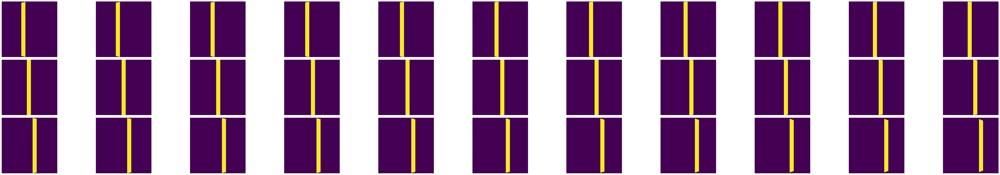

In [ ]:
vertical = [np.zeros((n_pix, n_pix)) for n in beam_locations]

for pp, stim in enumerate(vertical):

    total = beam_locations[pp]+max_pix

    if total <= n_pix:
        stim[:,beam_locations[pp]:beam_locations[pp]+max_pix] = 1
    else:
        remains = total - n_pix
        stim[:,beam_locations[pp]:(beam_locations[pp]+max_pix)-remains] = 1

    stim[~aperture.astype(bool)] = 0

prf.plot_stims(vertical)   

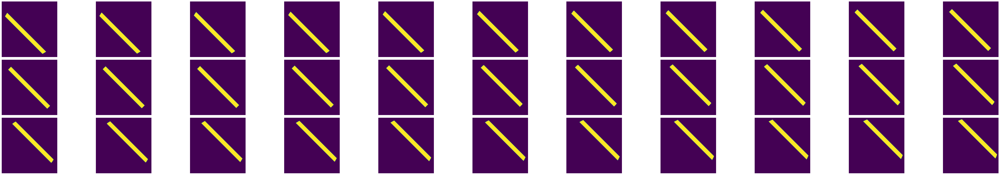

In [ ]:
from scipy.ndimage import rotate

rot45 = []

for pp, stim in enumerate(vertical):

    stim_rot = rotate(stim, 45, reshape=False, order=1)
    rot45.append(stim_rot)
    # stim[~aperture.astype(bool)] = 0

prf.plot_stims(rot45)   


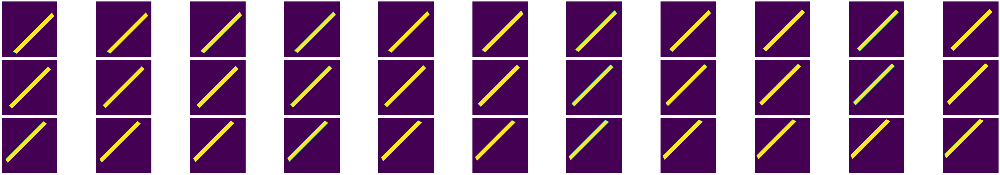

In [ ]:
rot135 = []

for pp, stim in enumerate(vertical):

    stim_rot = rotate(stim, 135, reshape=False, order=1)
    rot135.append(stim_rot)
    # stim[~aperture.astype(bool)] = 0

prf.plot_stims(rot135)


In [ ]:
# import random

# chunk_size = int(round((225-15-8)/8,0))
# chunk_nr = int(round((225-15-8)/chunk_size,0))

# baseline = np.dstack([np.zeros_like(stims[0]) for i in range(15)])
# isi_chunk = np.dstack([np.zeros_like(stims[0]) for i in range(chunk_size)])

# chunk_list = []
# for ii in range(chunk_nr):
#     add_chunk = np.dstack((test_stims[..., ii][..., np.newaxis], isi_chunk))
#     # print(add_chunk.shape)
#     chunk_list.append(add_chunk)
#     random.shuffle(chunk_list)

# chunk_list.insert(0,baseline)
# design = np.concatenate(chunk_list, axis=-1)
# design = np.dstack((design, np.dstack([np.zeros_like(stims[0]) for i in range(225-design.shape[-1])])))
# print(design.shape)



In [ ]:
use_settings = {'hori': [0, 18],
                'vert': [4, 25],
                'rot_45': [4, 18],
                'rot_135': [0, 5]}

np.sum([use_settings[ii][0] for ii in use_settings.keys()])
# pd.DataFrame(use_settings, index=['nr_stims', 'idx_lib'])

8

In [ ]:
# # useful plotting tips:
# # https://dfrieds.com/data-visualizations/style-plots-python-matplotlib.html

# # confirm location of stims
# from linescanning.utils import make_binary_cm
# fig, axs = plt.subplots(1, 4, figsize=(20, 15))
# cmap = make_binary_cm(216, 102, 32)
# humorfont = {'fontname': 'Humor Sans'}

# prf_actual = np.squeeze(prf.make_prf(prf_stim, size=params[2], mu_x=params[0], mu_y=params[1]),axis=0)
# alpha = 0.6

# cmap_grey = make_binary_cm(230,230,230)
# cmap_blue = make_binary_cm(8,178,240)

# plt.suptitle("example stimuli in 4 directions", y=0.65, fontsize=20, **humorfont)

# for ix,ii in enumerate(use_settings.keys()):

#     axs[ix].axvline(0, color='k', linestyle='dashed', lw=0.5)
#     axs[ix].axhline(0, color='k', linestyle='dashed', lw=0.5)
#     axs[ix].imshow(prf_actual, extent=vf_extent+vf_extent, cmap=cmap_blue)
#     axs[ix].imshow(lib[ii][use_settings[ii][1]], extent=vf_extent+vf_extent, cmap=cmap_grey, alpha=alpha)
#     axs[ix].axis('off')

# plt.show()


In [ ]:
lib = {'hori': horizontal,
       'vert': vertical,
       'rot_45': rot45,
       'rot_135': rot135,
       'filled': stims_fill,
       'conc': stims_conc}


def select_stims(settings_dict, frames=225, baseline_frames=15, randomize=False, shuffle=True, verbose=False):

    """
select_stims

Function to create a fictitious design matrix based on the 'lib'-variable containing a library of 4 different types of
bar stimuli: 'hori' (horizontal), 'vert' (vertical) 'rot_45' (horizontal bars rotated 45 degrees counterclockwise), 
and 'rot_135' (horizontal bars rotated 135 degrees counterclockwise). Using a 'settings'-dictionary, you can specify
how many and which of each of these stimuli you want. 

Args:
    settings_dict          : dict
                            dictionary containing the number of stimuli and index of stimuli (as per the library) that
                            you would like to include. An example is:

                            use_settings = {'hori': [0, 18],
                                            'vert': [4, 25],
                                            'rot_45': [4, 18],
                                            'rot_135': [0, 5]}

                            this selects 0 horizontal stimuli, 4x the 25th vertical stimulus in 'lib', 4x the 18th sti-
                            mulus of the 45 degree rotated stimuli, and 0 of the 135 degree rotated stimuli.

    frames                  : int (default = 225)
                            number of frames your design matrix should have. Should be the same as your functional data
                            in terms of TR!

    baseline_frames         : int (default = 15)
                            number of baseline frames before stimulus presentation begins. Only needs to be specified
                            if 'randomize' is set to False. 
    
    randomize               : bool (default = False)
                            boolean whether you want to completely randomize your experiment or not. Generally you'll 
                            want to set this to false, to create a regular intervals between stimuli. 

    shuffle                 : bool (default = True )
                            if randomize is turned off, we can still shuffle the order of the stimulus presentations.
                            This you can do by setting shuffle to True
    
    verbose                 : bool (default = False)
                            Set to True if you want some messages along the way

Returns:
    design/stims            : np.ndarray
                            <n_pix,n_pix,frames> numpy array representing your design

    """
    
    import numpy as np
    import random

    try:
        hori        = settings_dict['hori']
        vert        = settings_dict['vert']
        rot_45      = settings_dict['rot_45']
        rot_135     = settings_dict['rot_135']
        filled      = settings_dict['filled']
        conc        = settings_dict['conc']
    except:
        print(select_stims.__doc__)
        raise Exception("Could not extract relevant information; check the doc for an example of settings_dict")

    total_stims = np.sum([settings_dict[ii][0] for ii in settings_dict.keys()])

    if verbose:
        print(f"Creating design with {total_stims} stimuli and length of {frames}")

    stims = []

    # get stims for each orientation
    for ori in settings_dict.keys():

        if verbose:
            print(f"Using {settings_dict[ori][0]} stimuli of '{ori}'-orientation")

        if settings_dict[ori][0] != 0:
            if not settings_dict[ori][1]:
                idc = np.random.choice(33,1)[0]
            else:
                idc = settings_dict[ori][1]

        for ii in range(settings_dict[ori][0]):
            stims.append(lib[ori][idc])
            
    # fill to end of frames
    nr_stims = len(stims)
    fill_stims = frames - nr_stims

    # completely randomize trials and baseline
    if randomize:
        for ii in range(fill_stims):
            stims.append(np.zeros_like(stims[0]))

        stims = np.array(stims)

        idc = np.arange(0,frames)
        np.random.shuffle(idc)
        stims = stims[idc,:,:]

        return stims.T

    # make regular intervals between stimuli
    else:
        # fetch how many frames do not have stimulus
        frames_no_stim = fill_stims - baseline_frames

        # fetch how many frames should be presented between each stimulus
        chunk_size = int(round((frames_no_stim)/total_stims, 0))

        # get the number of chunks (i think this is redundant, as it's the same as the number of stimuli..)
        chunk_nr = int(round((frames_no_stim)/chunk_size, 0))

        # create (n_pix,n_pix,baseline_frames) array
        baseline = np.dstack([np.zeros_like(stims[0]) for i in range(baseline_frames)])

        # create (n_pix,n_pix,chunk_size) array
        isi_chunk = np.dstack([np.zeros_like(stims[0]) for i in range(chunk_size)])

        # initialize list
        chunk_list = []

        # loop through stimuli
        for ii in range(chunk_nr):

            # create chunk with stimulus + isi
            add_chunk = np.dstack((stims[ii][..., np.newaxis], isi_chunk))
            chunk_list.append(add_chunk)

            # shuffle the order of stimulus presentations
            if shuffle:
                random.shuffle(chunk_list)
        
        # add baseline at the beginning
        chunk_list.insert(0,baseline)

        # concatenate into a numpy array
        design = np.concatenate(chunk_list, axis=-1)

        # add or cut frames at the end to meet the nr of frames
        if design.shape[-1] > frames:
            design = design[:,:,:frames]
        elif design.shape[-1] < frames:
            design = np.dstack((design, np.dstack([np.zeros_like(stims[0]) for i in range(frames-design.shape[-1])])))

        if verbose:
            print(f"design has shape: {design.shape}")
            print("done")
        
        return design,total_stims


In [ ]:
# Fully centered stimuli (8 stims)
use_settings = {'hori': [0, 18],
                'vert': [4, 25],
                'rot_45': [4, 18],
                'rot_135': [0, 5],
                'filled': [0, 0],
                'conc': [0, 0]}

center_design_full,n_stims = select_stims(settings_dict=use_settings)            
s

# Fully centered stimuli (4 stims)
use_settings = {'hori': [0, 18],
                'vert': [2, 25],
                'rot_45': [2, 18],
                'rot_135': [0, 5],
                'filled': [0, 0],
                'conc': [0, 0]}

center_design_half,n_stims = select_stims(settings_dict=use_settings)

# Half center/half surround
use_settings = {'hori': [0, 18],
                'vert': [4, 14],
                'rot_45': [4, 18],
                'rot_135': [0, 5],
                'filled': [0, 0],
                'conc': [0, 0]}

center_surround,n_stims = select_stims(settings_dict=use_settings)

# full surround
use_settings = {'hori': [0, 18],
                'vert': [4, 14],
                'rot_45': [4, 28],
                'rot_135': [0, 5],
                'filled': [0, 0],
                'conc': [0, 0]}

surround,n_stims = select_stims(settings_dict=use_settings)


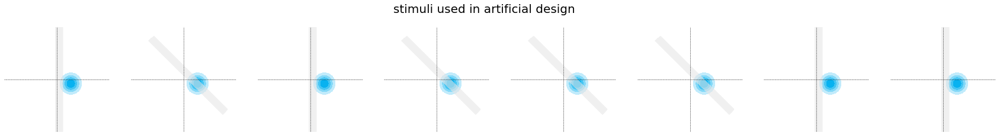

In [ ]:
# which design to plot
design_to_use = center_surround

total_stims = n_stims

f, sub = plt.subplots(1, total_stims, figsize=(30, 10))  # , figsize=(25,10))
humorfont = {'fontname': 'Humor Sans'}
prf_actual = np.squeeze(prf.make_prf(prf_stim, size=params[2], mu_x=params[0], mu_y=params[1]),axis=0)
cmap_grey = make_binary_cm(230,230,230)
cmap_blue = make_binary_cm(8,178,240)

plt.suptitle("stimuli used in artificial design", y=0.68, fontsize=20, **humorfont)

count = 0
for ii in range(design_to_use.shape[-1]):

    max_val = np.amax(design_to_use[..., ii])
    if max_val > 0:
        sub[count].axvline(0, color='k', linestyle='dashed', lw=0.5)
        sub[count].axhline(0, color='k', linestyle='dashed', lw=0.5)
        sub[count].imshow(prf_actual, extent=vf_extent+vf_extent, cmap=cmap_blue, aspect=1)
        sub[count].imshow(design_to_use[..., ii], extent=vf_extent+vf_extent, cmap=cmap_grey, alpha=0.6, aspect=1)
        sub[count].axis('off')

        count += 1


In [ ]:
# f, sub = plt.subplots(1, 30, figsize=(40, 6))
# for x in range(15, 45):
#     sub[x-15].imshow(test_stims[...,x])
#     sub[x-15].axis('off')

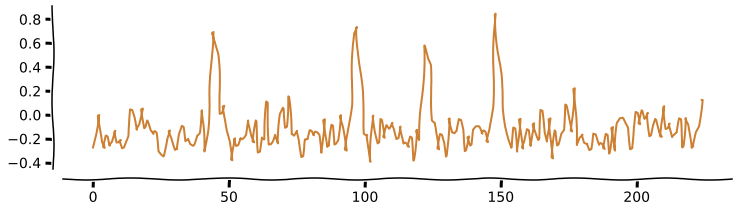

In [ ]:
prf_stim_simu = stimulus.PRFStimulus2D(screen_size_cm=70, screen_distance_cm=225, design_matrix=design_to_use,TR=1.5)

# define model
gg_simu = model.Norm_Iso2DGaussianModel(stimulus=prf_stim_simu,
                                        filter_predictions=False,
                                        filter_type='sg',
                                        filter_params={'window_length': 300, 'polyorder': 1})

# get the prediction of the pRF timecourse given this stimulus package
x_simu = np.squeeze(gg_simu.return_prediction(*params).T)

# add noise to data
noise = np.random.normal(0, 0.1, x_simu.shape[0])
simu_fmri = x_simu+noise

glm.plot_array(simu_fmri, xkcd=True)


In [ ]:
# Fit data again
gf_simu = fit.Norm_Iso2DGaussianFitter(gg_simu, simu_fmri[..., np.newaxis].T)
old_params = np.array((*new_params[:3], new_params[-1]))[np.newaxis, ...]

#################################################################################################################
# # Uncomment to rerun gridsearch
# # ~250s
# gf_simu.grid_fit(surround_amplitude_grid, 
#                  surround_size_grid, 
#                  neural_baseline_grid,
#                  surround_baseline_grid, 
#                  gaussian_params=old_params, 
#                  n_batches=1)

# new_params_simu = gf_simu.gridsearch_params[0]
#################################################################################################################


In [ ]:
print(f"params = {new_params_simu}")
new_prediction_simu = gg_simu.return_prediction(*new_params_simu[:-1]).T

X_prf_simu      = new_params_simu[0]
Y_prf_simu      = new_params_simu[1]
A_simu          = new_params_simu[3]
B_simu          = new_params_simu[-3]/new_params_simu[3]
C_simu          = new_params_simu[5]
D_simu          = new_params_simu[-2]
ss_simu         = new_params_simu[6]
r2_simu         = new_params_simu[-1]
prf_size_simu   = new_params_simu[2]
norm_simu       = ss_simu/A_simu

# print('\n--------------------------------------------------------------------------------------------------')
# print(f'X                       = {round(X_prf_simu,2)} \t\t(was {round(X_prf,2)})')
# print(f'Y                       = {round(Y_prf_simu,2)} \t(was {round(Y_prf,2)})')
# print(f'A (prf amplitude/beta)  = {round(A_simu,2)} \t\t(was {round(A,2)})')
# print(f'B (neural baseline)     = {round(B_simu,2)} \t\t(was {round(B,2)})')
# print(f'C (surround amplitude)  = {round(C_simu,2)} \t\t(was {round(C,2)})')
# print(f'D (surround baseline)   = {round(D_simu,2)} \t\t(was {round(D,2)})')
# print(f'R2                      = {round(r2_simu,2)} \t\t(was {round(r2,2)})')
# print(f'Surround size           = {round(ss_simu,2)} \t\t(was {round(ss,2)})')
# print(f'pRF size                = {round(prf_size_simu,2)} \t(was {round(prf_size,2)})')
# print(f'Size ratio (phi)        = {round(norm_simu,2)} \t\t(was {round(norm,2)})')

output = {'new': [X_prf_simu, Y_prf_simu, A_simu, B_simu, C_simu, D_simu, ss_simu, r2_simu, prf_size_simu, norm_simu],
          'old': [X_prf, Y_prf, A, B, C, D, ss, r2, prf_size, norm]}

output_df = pd.DataFrame(output, index=['x', 'y', 'A (prf ampl)', 'B (neural base)', 'C (surround ampl)', 'D (surround base)', 'surround size', 'r2', 'prf size', 'size ratio (phi)'])
print(output_df)

glm.plot_array([simu_fmri, new_prediction_simu], xkcd=True)

NameError: name 'new_params_simu' is not defined

---
# Deconvolve simulated experiment

- size/response curve experiment
- 'standard' pRF-experiment; move bar every TR

In [ ]:
lib = {'hori': horizontal,
       'vert': vertical,
       'rot_45': rot45,
       'rot_135': rot135,
       'filled': stims_fill,
       'conc': stims_conc}

def get_onset_idx(design):

    idx = []
    for ii in range(design.shape[-1]):

        if np.amax(design[..., ii]) != 0:
            idx.append(ii)

    idx = np.array(idx)

    return idx

def select_stims(settings_dict, frames=225, baseline_frames=15, randomize=False, shuffle=True, verbose=False, TR=1.5, return_onsets=False, settings_fn=None):

    """
select_stims

Function to create a fictitious design matrix based on the 'lib'-variable containing a library of 4 different types of
bar stimuli: 'hori' (horizontal), 'vert' (vertical) 'rot_45' (horizontal bars rotated 45 degrees counterclockwise), 
and 'rot_135' (horizontal bars rotated 135 degrees counterclockwise). Using a 'settings'-dictionary, you can specify
how many and which of each of these stimuli you want. 

Args:
    settings_dict          : dict
                            dictionary containing the number of stimuli and index of stimuli (as per the library) that
                            you would like to include. An example is:

                            use_settings = {'hori': [0, 18],
                                            'vert': [4, 25],
                                            'rot_45': [4, 18],
                                            'rot_135': [0, 5]}

                            this selects 0 horizontal stimuli, 4x the 25th vertical stimulus in 'lib', 4x the 18th sti-
                            mulus of the 45 degree rotated stimuli, and 0 of the 135 degree rotated stimuli.

    frames                  : int (default = 225)
                            number of frames your design matrix should have. Should be the same as your functional data
                            in terms of TR!

    baseline_frames         : int (default = 15)
                            number of baseline frames before stimulus presentation begins. Only needs to be specified
                            if 'randomize' is set to False. 
    
    randomize               : bool (default = False)
                            boolean whether you want to completely randomize your experiment or not. Generally you'll 
                            want to set this to false, to create a regular intervals between stimuli. 

    shuffle                 : bool (default = True )
                            if randomize is turned off, we can still shuffle the order of the stimulus presentations.
                            This you can do by setting shuffle to True
    
    verbose                 : bool (default = False)
                            Set to True if you want some messages along the way

Returns:
    design/stims            : np.ndarray
                            <n_pix,n_pix,frames> numpy array representing your design

    """
    
    import numpy as np
    import random

    onset_idx = None
    index_shuf = None

    try:
        hori        = settings_dict['hori']
        vert        = settings_dict['vert']
        rot_45      = settings_dict['rot_45']
        rot_135     = settings_dict['rot_135']
        filled      = settings_dict['filled']
        conc        = settings_dict['conc']
    except:
        print(select_stims.__doc__)
        raise Exception("Could not extract relevant information; check the doc for an example of settings_dict")

    total_stims = np.sum([settings_dict[ii][0] for ii in settings_dict.keys()])  

    if verbose:
        print(f"Creating design with {total_stims} stimuli and length of {frames}")

    stims = []

    # get stims for each orientation
    for ori in settings_dict.keys():

        if verbose:
            print(f" Using {settings_dict[ori][0]} stimuli of '{ori}'-orientation")

        if settings_dict[ori][0] != 0:

            if isinstance(settings_dict[ori][1], np.ndarray) or isinstance(settings_dict[ori][1], list):
                idc_list = settings_dict[ori][1]

                onset_idx = list(np.tile(idc_list, settings_dict[ori][0]))

                for ii in range(settings_dict[ori][0]):
                    stims.append(np.array([lib['filled'][ii] for ii in idc_list]).T)
                
                stims = np.concatenate(stims, axis=-1)
                
            else:
                if not settings_dict[ori][1]:
                    idc = np.random.choice(33,1)[0]
                else:
                    idc = settings_dict[ori][1]

                for ii in range(settings_dict[ori][0]):
                    stims.append(lib[ori][idc])

    if verbose:
        if isinstance(stims, np.ndarray):
            print(f"Stimuli have shape {stims.shape}")
        else:
            print(f"Stimuli have shape {len(stims)}")
                   
    # fill to end of frames
    nr_stims = len(stims)
    fill_stims = frames - nr_stims

    # completely randomize trials and baseline
    if randomize:
        for ii in range(fill_stims):
            stims.append(np.zeros_like(stims[0]))

        stims = np.array(stims)

        idc = np.arange(0,frames)
        np.random.shuffle(idc)
        stims = stims[idc,:,:]

        return stims.T

    # make regular intervals between stimuli
    else:
        if isinstance(stims, np.ndarray):
            ref = stims[...,0]
            actual_stims = stims.shape[-1]
        else:
            ref = stims[0]
            actual_stims = total_stims

        # do ISI calculation as in exptools experiment:
        import yaml

        # from exptools2.core.session._load_settings()
        with open(settings_fn, 'r', encoding='utf8') as f_in:
            settings = yaml.safe_load(f_in)

        total_iti_duration = actual_stims * settings['design'].get('mean_iti_duration')
        min_iti_duration = total_iti_duration - settings['design'].get('total_iti_duration_leeway'), 
        max_iti_duration = total_iti_duration + settings['design'].get('total_iti_duration_leeway')

        def return_itis(mean_duration, minimal_duration, maximal_duration, n_trials):
            itis = np.random.exponential(scale=mean_duration-minimal_duration, size=n_trials)
            itis += minimal_duration
            itis[itis>maximal_duration] = maximal_duration
            return itis

        nits = 0
        itis = return_itis(
            mean_duration=settings['design'].get('mean_iti_duration'),
            minimal_duration=settings['design'].get('minimal_iti_duration'),
            maximal_duration=settings['design'].get('maximal_iti_duration'),
            n_trials=actual_stims)
        while (itis.sum() < min_iti_duration) | (itis.sum() > max_iti_duration):
            itis = return_itis(
                mean_duration=settings['design'].get('mean_iti_duration'),
                minimal_duration=settings['design'].get('minimal_iti_duration'),
                maximal_duration=settings['design'].get('maximal_iti_duration'),
                n_trials=actual_stims)
            nits += 1

        if verbose:
            print(f'ITIs created with total ITI duration of {itis.sum()} after {nits} iterations')

        # fetch new nr of frames based on ITIs
        frames = int(itis.sum()/TR)

        if verbose:
            print(f"New nr of frames = {frames} based on ITIs")

        # new nr of frames to fill
        fill_stim = frames - actual_stims

        # fetch how many frames do not have stimulus
        frames_no_stim = fill_stims - baseline_frames

        # fetch how many frames should be presented between each stimulus
        chunk_size = int(round((frames_no_stim)/actual_stims, 0))

        # create (n_pix,n_pix,baseline_frames) array
        baseline = np.dstack([np.zeros_like(ref) for i in range(baseline_frames)])

        # initialize list
        chunk_list = []

        # loop through stimuli
        for ii in np.arange(0,actual_stims):
            
            if isinstance(stims, np.ndarray):
                stim_array = stims[...,ii]
            else:
                stim_array = stims[ii]

            # create (n_pix,n_pix,chunk_size) array
            isi_chunk = np.dstack([np.zeros_like(ref) for i in range(int(itis[ii]/TR))])

            # create chunk with stimulus + isi
            add_chunk = np.dstack((stim_array[..., np.newaxis], isi_chunk))

            # if verbose:
            #     print(f" Added chunk nr {ii} with shape: {add_chunk.shape}")

            chunk_list.append(add_chunk)

        # shuffle the order of stimulus presentations
        if shuffle:
            
            if onset_idx:

                # I do this so we can keep track of which stimulus in the list was presented
                chunk_list_shuff = []
                stim_shuff = []
                index_shuf = np.arange(0,len(onset_idx))
                random.shuffle(index_shuf)

                for i in index_shuf:
                    chunk_list_shuff.append(chunk_list[i])
                    stim_shuff.append(onset_idx[i])

            else:
                random.shuffle(chunk_list)
                chunk_list_shuff = chunk_list

        # add baseline at the beginning
        chunk_list_shuff.insert(0,baseline)

        # concatenate into a numpy array
        design = np.concatenate(chunk_list_shuff, axis=-1)

        # if verbose:
        #     print(f"Current design shape = {design.shape}")

        # # add or cut frames at the end to meet the nr of frames
        # if design.shape[-1] > frames:
        #     if verbose:
        #         print(f"Removing {design.shape[-1]-frames} frames")
            
        #     design = design[:,:,:frames]
        # elif design.shape[-1] < frames:
        #     if verbose:
        #         print(f"Adding {frames-design.shape[-1]} frames")
        #     design = np.dstack((design, np.dstack([np.zeros_like(ref) for i in range(frames-design.shape[-1])])))

        if verbose:
            print(f"Design has shape: {design.shape}")
        
        if return_onsets:
            # # create onset df
            # try:
            if verbose:
                print("Creating onset dataframe")

            onset_frames = get_onset_idx(design)
            onset_times = onset_frames*TR

            onset_dict = {'onset': onset_times, 
                          'event_type': stim_shuff}

            onset_df = pd.DataFrame(onset_dict)

            if verbose:
                print("Done")
                
            return design, onset_df

            # except:
            #     if verbose:
            #         print("Not returning onset dataframe")

                    
        else:

            if verbose:
                print("Done")

            return design


In [ ]:
# save in utils folder
lib_fn = opj(os.environ['DIR_SCRIPTS'], 'bin', 'utils', 'stimulus_library.pkl')
import pickle

if not os.path.exists(lib_fn):
    f = open(lib_fn, 'wb')
    pickle.dump(lib, f)
    f.close()
else:
    with open(lib_fn, 'rb') as fn:
        lib2 = pickle.load(fn)

In [ ]:
lower_dva, upper_dva = utils.find_nearest(stims_fill_sizes,0.2)[0],utils.find_nearest(stims_fill_sizes,4)[0]

n_stims_select = 7

print(lower_dva,upper_dva)
idc_list = list(np.linspace(lower_dva,upper_dva,num=n_stims_select).astype(int))
idc_list

1 30


[1, 5, 10, 15, 20, 25, 30]

In [ ]:
# Half center/half surround
use_settings = {'hori': [0, 18],
                'vert': [0, 14],
                'rot_45': [0, 18],
                'rot_135': [0, 5],
                'filled': [10, idc_list],
                'conc': [0, 0]}

settings_fn = opj(os.path.dirname(glm.__file__), 'experiments', 'gouws', 'settings.yml')

size_response,onset_df = select_stims(settings_dict=use_settings, verbose=True, frames=5700, return_onsets=True, TR=0.105, settings_fn=settings_fn)

# convert index in stims_fill_sizes to degree-of-visual-angle (dva)
onset_df['event_type'] = [round(stims_fill_sizes[ii],2) for ii in onset_df['event_type'].values]

Creating design with 10 stimuli and length of 5700
 Using 0 stimuli of 'hori'-orientation
 Using 0 stimuli of 'vert'-orientation
 Using 0 stimuli of 'rot_45'-orientation
 Using 0 stimuli of 'rot_135'-orientation
 Using 10 stimuli of 'filled'-orientation
 Using 0 stimuli of 'conc'-orientation
Stimuli have shape (270, 270, 70)
ITIs created with total ITI duration of 418.86481499225465 after 2 iterations
New nr of frames = 3989 based on ITIs
Design has shape: (270, 270, 4039)
Creating onset dataframe
Done


In [ ]:
dva_conds = onset_df['event_type'].unique()
dva_conds.sort()
print(dva_conds)
print(idc_list)

[0.13 0.67 1.34 2.01 2.68 3.35 4.02]
[1, 5, 10, 15, 20, 25, 30]


In [ ]:
%reload_ext autoreload
%autoreload 2

osf = 1000

# get value in S-R curve per dva
ampl = mean_srf_fill[idc_list]
stims_v = glm.make_stimulus_vector(onset_df, scan_length=size_response.shape[-1], osf=osf, type='event', amplitude=ampl)

print(stims_v)

Amplitude for event '0.13' = 0.06
Amplitude for event '0.67' = 0.69
Amplitude for event '1.34' = 1.0
Amplitude for event '2.01' = 0.87
Amplitude for event '2.68' = 0.65
Amplitude for event '3.35' = 0.45
Amplitude for event '4.02' = 0.31
{0.13: array([0., 0., 0., ..., 0., 0., 0.]), 0.67: array([0., 0., 0., ..., 0., 0., 0.]), 1.34: array([0., 0., 0., ..., 0., 0., 0.]), 2.01: array([0., 0., 0., ..., 0., 0., 0.]), 2.68: array([0., 0., 0., ..., 0., 0., 0.]), 3.35: array([0., 0., 0., ..., 0., 0., 0.]), 4.02: array([0., 0., 0., ..., 0., 0., 0.])}


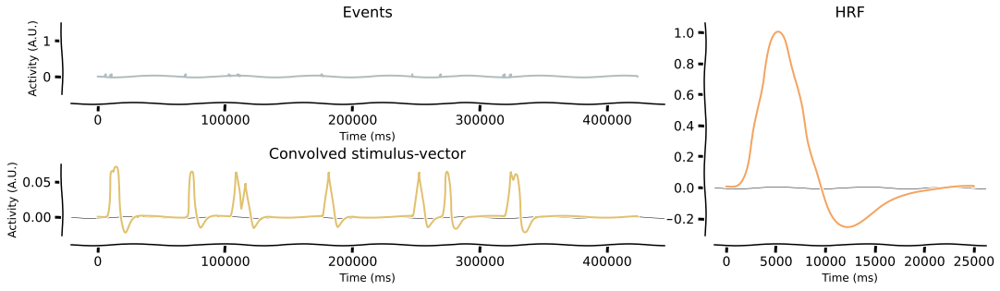

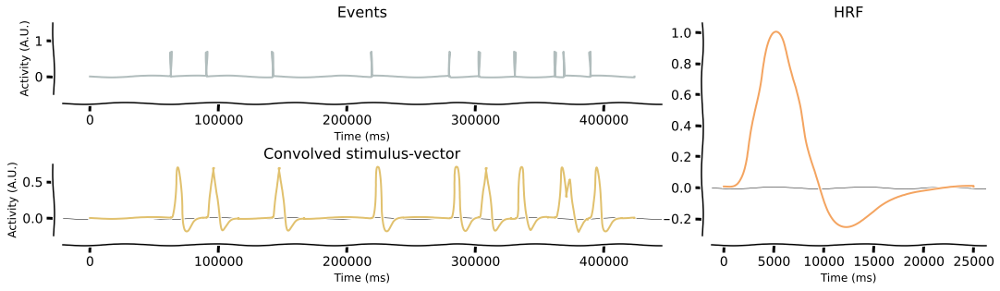

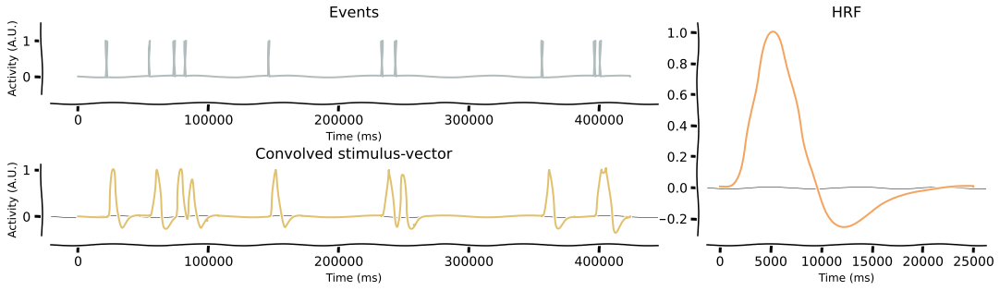

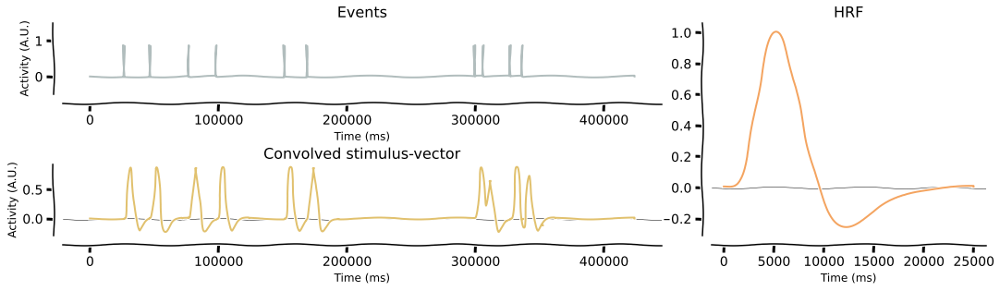

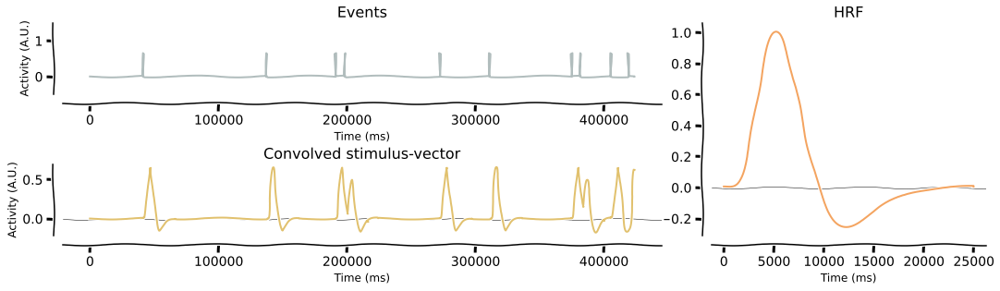

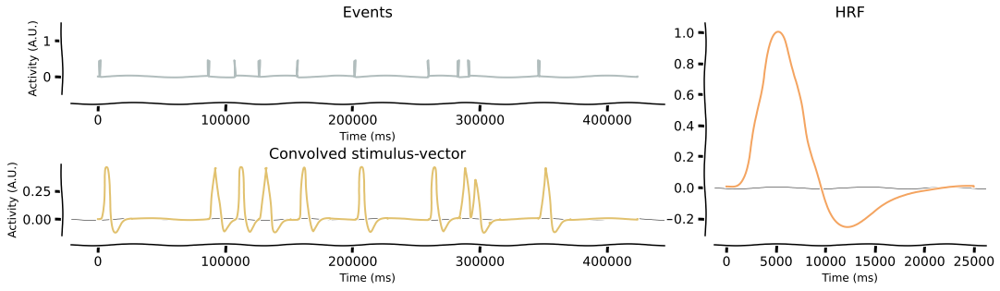

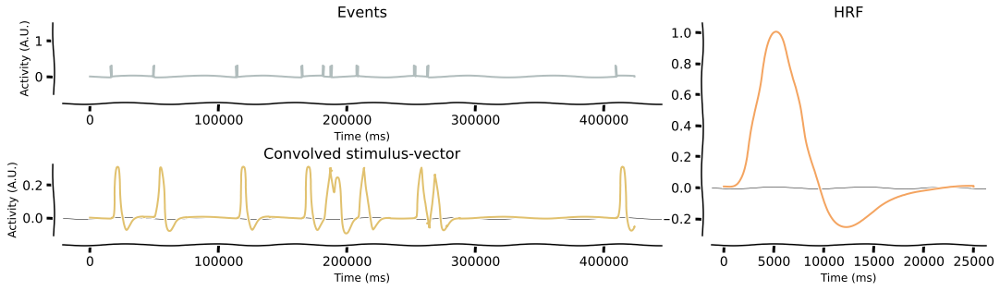

In [ ]:
# define HRF
dt = 1/osf
time_points = np.linspace(0,25,np.rint(float(25)/dt).astype(int))
canonical_hrf = glm.double_gamma(time_points, lag=6)

# convolve with HRF
convolved_v = {}
for ii in dva_conds:
    convolved_v[ii] = glm.convolve_hrf(canonical_hrf, stims_v[ii], make_figure=True, xkcd=True)

In [ ]:
desired_scale = np.arange(0, int(size_response.shape[-1]), 1)

convolved_v_ds = {}
for ii in dva_conds:
    convolved_v_ds[ii] = glm.resample_stim_vector(convolved_v[ii], size_response.shape[-1])

In [ ]:
# add some noise
synth_fmri = {}
noise_lvl = np.linspace(0.01,0.05,num=n_stims_select)
for ix,ii in enumerate(dva_conds):
    noise = np.random.normal(0, noise_lvl[ix], size_response.shape[-1])
    synth_fmri[ii] = (convolved_v_ds[ii]+noise).astype(float)

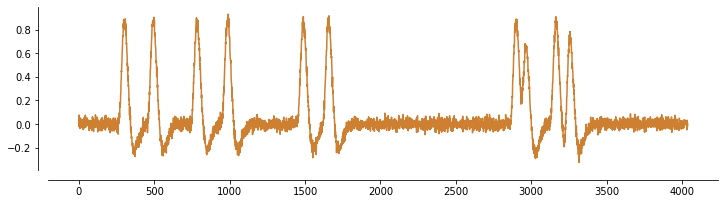

In [ ]:
glm.plot_array(synth_fmri[dva_conds[3]])

In [ ]:
TR = 0.105
data = pd.DataFrame(synth_fmri)
data['subject'], data['run'], data['t'] = 1, 1, list(TR*np.arange(data.shape[0]))
data = data.set_index(['subject', 'run', 't'])
data.head()

0.13      0.67      1.34      2.01      2.68      3.35  \
subject run t                                                                   
1       1   0.000 -0.014491  0.022333 -0.052537 -0.012388  0.035152  0.033464   
            0.105  0.002970 -0.000817  0.015534 -0.022876 -0.011314 -0.012050   
            0.210 -0.007185 -0.003493 -0.025031  0.076355 -0.002528  0.046223   
            0.315  0.000437 -0.000015 -0.016609 -0.020056  0.025116 -0.009875   
            0.420  0.001049  0.021751 -0.012622  0.014619 -0.021664  0.007393   

                       4.02  
subject run t                
1       1   0.000  0.030254  
            0.105  0.020783  
            0.210 -0.058256  
            0.315  0.017077  
            0.420  0.045643

In [ ]:
onset_df['subject'], onset_df['run'] = 1,1
onset_df['event_type'] = onset_df['event_type'].astype(str)
onset_df['onset'] = onset_df['onset'].astype(float)
onset_df2 = onset_df.set_index(['subject', 'run', 'event_type'])
onset_df2

onset
subject run event_type         
1       1   3.35          1.575
            0.13          5.985
            0.13         10.290
            4.02         16.380
            1.34         21.840
...                         ...
            1.34        396.795
            1.34        401.310
            2.68        405.825
            4.02        409.500
            2.68        419.055

[70 rows x 1 columns]

In [ ]:
min_int = 0
max_int = 20
n_regres = None
fs = 1/TR

g_model = nd.GroupResponseFitter(data,
                                 onset_df2,
                                 input_sample_rate=fs,
                                 concatenate_runs=False,
                                 confounds=None, 
                                 add_intercept=False)

cond = onset_df2.reset_index().event_type.unique()
[g_model.add_event(i,
                  basis_set='fir',
                  n_regressors=n_regres,
                  interval=[min_int,max_int]) for i in cond]
           
g_model.fit()
print("Done")

Done


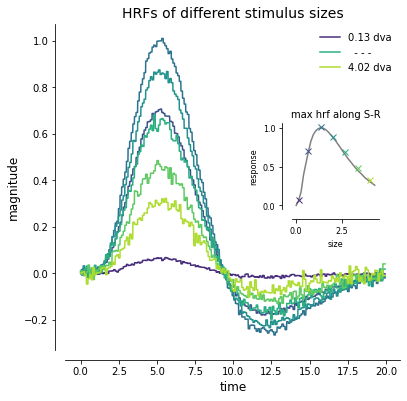

In [ ]:
cols = sns.color_palette('viridis', dva_conds.shape[0])
tmp = g_model.get_subjectwise_timecourses().reset_index()

fig,axs = plt.subplots(figsize=(6,6))
max_vals = []
for idc,ii in enumerate(dva_conds):

    jj = tmp[(tmp['event type'] == str(ii))][ii].values
    xx = tmp[(tmp['event type'] == str(ii))]['time'].values

    axs.plot(xx,jj, color=cols[idc], label=f"{str(ii)} dva")
    sns.despine(offset=10)
    max_vals.append(np.amax(jj))
    
max_vals = np.array(max_vals)
    
plt.xlabel('time')
plt.ylabel('magnitude')

tmp_ax = plt.gca()
for item in ([tmp_ax.xaxis.label, tmp_ax.yaxis.label] +
             tmp_ax.get_xticklabels() + tmp_ax.get_yticklabels()):
    item.set_fontsize(12)

handles, labels = tmp_ax.get_legend_handles_labels()
middle = int(round(float(len(handles) / 2),0))
labels_new = [labels[0], '  - - -', labels[-1]]
handles_new = [handles[0], handles[middle], handles[-1]]
plt.legend(handles_new, labels_new, frameon=False)
plt.title('HRFs of different stimulus sizes').set_fontsize(14)
left, bottom, width, height = [0.65, 0.45, 0.2, 0.2]
ax2 = fig.add_axes([left, bottom, width, height])
sns.despine(offset=10)
ax2.set_xlabel('size')
ax2.set_ylabel('response')
ax2.plot(stims_fill_sizes, mean_srf_fill, color=(128/255, 128/255, 128/255))

for ix,kk in enumerate(max_vals):
    ax2.plot(dva_conds.astype(float)[ix], kk, color=cols[ix], marker='x')

for item in ([ax2.xaxis.label, ax2.yaxis.label] +
             ax2.get_xticklabels() + ax2.get_yticklabels()):
    item.set_fontsize(8)
    
ax2.set_title('max hrf along S-R')
ax2.title.set_fontsize(10)
    
plt.show()

[ 6.   6.5  7.   7.5  8.   8.5  9.   9.5 10.  10.5]
[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9]
[ 3  4  5  6  7  8  9 10 11 12]
[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9]
[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9]


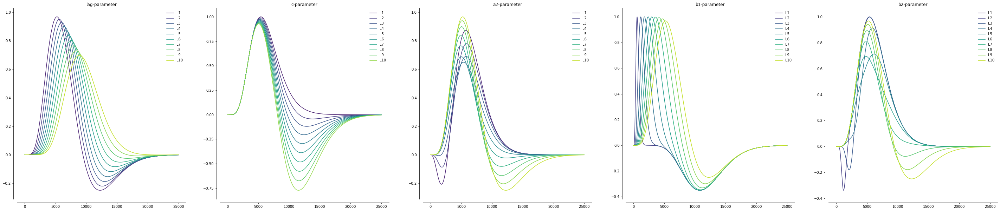

In [ ]:
#---------------------------------------------------------------------------------------
# change the lag of HRF
hrf_lags = np.arange(6,11,0.5)
print(hrf_lags)
col_hrfs = sns.color_palette('viridis', hrf_lags.shape[0])

fig,axs = plt.subplots(1,5,figsize=(50,10))
# axs.plot(canonical_hrf, color=col_hrfs[0], label='canonical')
hrfs = []
for ix,ii in enumerate(hrf_lags):
    hrf = glm.double_gamma(time_points, lag=ii, scale=False)
    hrfs.append(hrf)
    axs[0].plot(hrf, color=col_hrfs[ix], label=f'L{ix+1}')
    axs[0].legend(frameon=False)
    sns.despine(offset=10)

    axs[0].set_title('lag-parameter')


#---------------------------------------------------------------------------------------
# change C-parameter of HRF
hrf_c = np.arange(0,1,0.1)
print(hrf_c)
col_hrfs = sns.color_palette('viridis', hrf_c.shape[0]+1)

# axs.plot(canonical_hrf, color=col_hrfs[0], label='canonical')
hrfs = []
for ix,ii in enumerate(hrf_c):
    hrf = glm.double_gamma(time_points, c=ii, scale=False)
    hrfs.append(hrf)
    axs[1].plot(hrf, color=col_hrfs[ix], label=f'L{ix+1}')
    axs[1].legend(frameon=False)
    sns.despine(offset=10)

    axs[1].set_title('c-parameter')


#---------------------------------------------------------------------------------------
# change a2-parameter of HRF
hrf_a2 = np.arange(3,13,1)
print(hrf_a2)
col_hrfs = sns.color_palette('viridis', hrf_a2.shape[0])

# axs.plot(canonical_hrf, color=col_hrfs[0], label='canonical')
hrfs = []
for ix,ii in enumerate(hrf_a2):
    hrf = glm.double_gamma(time_points, a2=ii, scale=False)
    hrfs.append(hrf)
    axs[2].plot(hrf, color=col_hrfs[ix], label=f'L{ix+1}')
    axs[2].legend(frameon=False)
    sns.despine(offset=10)

    axs[2].set_title('a2-parameter')


#---------------------------------------------------------------------------------------
# change b1-parameter of HRF
hrf_b1 = np.arange(0,1,0.1)
print(hrf_b1)
col_hrfs = sns.color_palette('viridis', hrf_b1.shape[0])

# axs.plot(canonical_hrf, color=col_hrfs[0], label='canonical')
hrfs = []
for ix,ii in enumerate(hrf_b1):
    hrf = glm.double_gamma(time_points, b1=ii, scale=False)
    hrfs.append(hrf)
    axs[3].plot(hrf, color=col_hrfs[ix], label=f'L{ix+1}')
    axs[3].legend(frameon=False)
    sns.despine(offset=10)

    axs[3].set_title('b1-parameter')


#---------------------------------------------------------------------------------------
# change b2-parameter of HRF
hrf_b2 = np.arange(0,1,0.1)
print(hrf_b2)
col_hrfs = sns.color_palette('viridis', hrf_b2.shape[0])

# axs.plot(canonical_hrf, color=col_hrfs[0], label='canonical')
hrfs = []
for ix,ii in enumerate(hrf_b2):
    hrf = glm.double_gamma(time_points, b2=ii, scale=False)
    hrfs.append(hrf)
    axs[4].plot(hrf, color=col_hrfs[ix], label=f'L{ix+1}')
    axs[4].legend(frameon=False)
    sns.despine(offset=10)

    axs[4].set_title('b2-parameter')      

[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9]


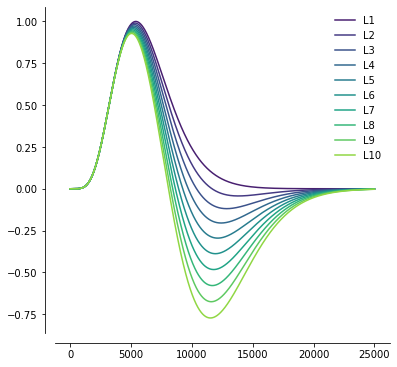

In [ ]:
hrf_c = np.arange(0,1,0.1)
print(hrf_c)
col_hrfs = sns.color_palette('viridis', hrf_c.shape[0]+1)

fig,axs = plt.subplots(figsize=(6,6))
# axs.plot(canonical_hrf, color=col_hrfs[0], label='canonical')
hrfs = []
for ix,ii in enumerate(hrf_c):
    hrf = glm.double_gamma(time_points, c=ii, scale=False)
    hrfs.append(hrf)
    axs.plot(hrf, color=col_hrfs[ix], label=f'L{ix+1}')
    axs.legend(frameon=False)
    sns.despine(offset=10)

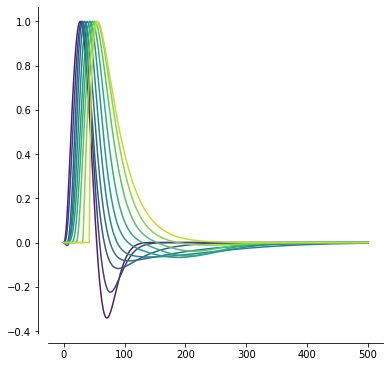

In [ ]:
import pybest
hrfs_fn = opj(os.path.dirname(pybest.__file__), 'data', 'hrf_ts.mat')
hrfs_data = loadmat(hrfs_fn)['hrf_ts'][:,::2]

col_hrfs = sns.color_palette('viridis', hrfs_data.shape[-1])

fig,axs = plt.subplots(figsize=(6,6))

for hrf in range(hrfs_data.shape[-1]):
    plt.plot(hrfs_data[:,hrf], color=col_hrfs[hrf])
    sns.despine(offset=10)

In [ ]:
hrfs_data.shape

(501, 10)

---
# Make some figures

In [ ]:
prf_array_new = prf.make_prf(prf_stim, size=new_params[2], mu_x=new_params[0], mu_y=params[1])
prf.plot_prf(prf_array_new, vf_extent)

In [ ]:
i, j = np.unravel_index(np.squeeze(prf_array_new, axis=0).argmax(), np.squeeze(prf_array_new, axis=0).shape)

i_ext = ((i/270)*10)-5
j_ext = ((j/270)*10)-5

In [ ]:
# https://stackoverflow.com/questions/9215658/plot-a-circle-with-pyplot
# very useful for plotting circles in matplotlib

fig, ax = plt.subplots(figsize=(6,6))
cmap_blue = make_binary_cm(8,178,240)
cmap_grey = make_binary_cm(230,230,230)
ax.axvline(0, color='k', linestyle='dashed', lw=0.5)
ax.axhline(0, color='k', linestyle='dashed', lw=0.5)
# ax.imshow(lib['vert'][use_settings['vert'][1]], extent=vf_extent+vf_extent, cmap=cmap_grey, alpha=alpha)
im = ax.imshow(np.squeeze(prf_array_new, axis=0), extent=vf_extent+vf_extent, cmap=cmap_blue)
ax.imshow(center_dot, extent=vf_extent+vf_extent, cmap=cmap_white)
patch = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax.transData)
draw_circle = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax.transData, fill=False, lw=2, clip_on=False)
draw_dot = patches.Circle((j_ext+0.04,-i_ext), radius=0.1, transform=ax.transData, fc=(1,1,1))

im.set_clip_path(patch)
# ax.add_artist(draw_circle)
ax.add_artist(draw_dot)
ax.axis('off')

plt.savefig(opj(fig_dir, 'prf_a.png'), transparant=True, dpi=600, bbox_inches='tight')


In [ ]:
# https://stackoverflow.com/questions/9215658/plot-a-circle-with-pyplot
# very useful for plotting circles in matplotlib

fig, ax = plt.subplots(figsize=(6,6))
cmap_blue = make_binary_cm(8,178,240)
cmap_grey = make_binary_cm(230,230,230)
ax.axvline(0, color='k', linestyle='dashed', lw=0.5)
ax.axhline(0, color='k', linestyle='dashed', lw=0.5)
im = ax.imshow(lib['vert'][use_settings['vert'][1]], extent=vf_extent+vf_extent, cmap=cmap_grey, alpha=alpha)
# im = ax.imshow(np.squeeze(prf_array_new, axis=0), extent=vf_extent+vf_extent, cmap=cmap_blue)
ax.imshow(center_dot, extent=vf_extent+vf_extent, cmap=cmap_white)
patch = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax.transData)
draw_circle = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax.transData, fill=False, lw=2, clip_on=False)
draw_dot = patches.Circle((j_ext+0.04,-i_ext), radius=0.1, transform=ax.transData, fc=(1,1,1))

# im.set_clip_path(patch)
# ax.add_artist(draw_circle)
# ax.add_artist(draw_dot)
ax.axis('off')

plt.savefig(opj(fig_dir, 'prf_b.png'), transparant=True, dpi=600, bbox_inches='tight')


In [ ]:
# https://stackoverflow.com/questions/9215658/plot-a-circle-with-pyplot
# very useful for plotting circles in matplotlib

fig, ax = plt.subplots(figsize=(6,6))
cmap_blue = make_binary_cm(8,178,240)
cmap_grey = make_binary_cm(230,230,230)
ax.axvline(0, color='k', linestyle='dashed', lw=0.5)
ax.axhline(0, color='k', linestyle='dashed', lw=0.5)
ax.imshow(lib['vert'][use_settings['vert'][1]], extent=vf_extent+vf_extent, cmap=cmap_grey, alpha=alpha)
im = ax.imshow(np.squeeze(prf_array_new, axis=0), extent=vf_extent+vf_extent, cmap=cmap_blue)
ax.imshow(center_dot, extent=vf_extent+vf_extent, cmap=cmap_white)
patch = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax.transData)
draw_circle = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax.transData, fill=False, lw=2, clip_on=False)
draw_dot = patches.Circle((j_ext+0.04,-i_ext), radius=0.1, transform=ax.transData, fc=(1,1,1))

im.set_clip_path(patch)
# ax.add_artist(draw_circle)
# ax.add_artist(draw_dot)
ax.axis('off')

plt.savefig(opj(fig_dir, 'prf_c.png'), transparant=True, dpi=600, bbox_inches='tight')


In [ ]:
dt = 1/100
time_points = np.linspace(0, 25, np.rint(float(25)/dt).astype(int))
canonical_hrf = glm.double_gamma(time_points, lag=6)

fig, ax = plt.subplots(figsize=(6,6))
ax.plot(canonical_hrf, color=(8/255, 178/255, 240/255))
# ax.axis('off')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_yticks([])
ax.set_xticks([])
# sns.despine(offset=10, trim=True)
ax.axis('off')
plt.savefig(opj(fig_dir, 'prf_d.png'), transparant=True, dpi=600, bbox_inches='tight')


In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.plot(new_prediction, color=(8/255, 178/255, 240/255))
# ax.axis('off')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_yticks([])
ax.set_xticks([])
# sns.despine(offset=10, trim=True)
ax.axis('off')
plt.savefig(opj(fig_dir, 'prf_e.png'), transparant=True, dpi=600, bbox_inches='tight')

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
ax.plot(synth_fmri, color=(8/255, 178/255, 240/255))
# ax.axis('off')
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.set_yticks([])
ax.set_xticks([])
# sns.despine(offset=10, trim=True)
ax.axis('off')
plt.savefig(opj(fig_dir, 'prf_f.png'), transparant=True, dpi=600, bbox_inches='tight')

In [ ]:
synth_fmri.shape

In [ ]:
fig, ax = plt.subplots(1,6, figsize=(30,6))

# plot 1: pRF model
ax[0].axvline(0, color='k', linestyle='dashed', lw=0.5)
ax[0].axhline(0, color='k', linestyle='dashed', lw=0.5)
# ax.imshow(lib['vert'][use_settings['vert'][1]], extent=vf_extent+vf_extent, cmap=cmap_grey, alpha=alpha)
im = ax[0].imshow(np.squeeze(prf_array_new, axis=0), extent=vf_extent+vf_extent, cmap=cmap_blue)
ax[0].imshow(center_dot, extent=vf_extent+vf_extent, cmap=cmap_white)
patch = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax[0].transData)
draw_circle = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax[0].transData, fill=False, lw=2, clip_on=False)
draw_dot = patches.Circle((j_ext+0.04,-i_ext), radius=0.1, transform=ax[0].transData, fc=(1,1,1))

im.set_clip_path(patch)
# ax.add_artist(draw_circle)
ax[0].add_artist(draw_dot)
ax[0].axis('off')


# plot 2: stimulus aperture
ax[1].axvline(0, color='k', linestyle='dashed', lw=0.5)
ax[1].axhline(0, color='k', linestyle='dashed', lw=0.5)
im = ax[1].imshow(lib['vert'][use_settings['vert'][1]], extent=vf_extent+vf_extent, cmap=cmap_grey, alpha=alpha)
# im = ax.imshow(np.squeeze(prf_array_new, axis=0), extent=vf_extent+vf_extent, cmap=cmap_blue)
ax[1].imshow(center_dot, extent=vf_extent+vf_extent, cmap=cmap_white)
patch = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax[1].transData)
draw_circle = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax[1].transData, fill=False, lw=2, clip_on=False)
draw_dot = patches.Circle((j_ext+0.04,-i_ext), radius=0.1, transform=ax[1].transData, fc=(1,1,1))

# im.set_clip_path(patch)
# ax.add_artist(draw_circle)
# ax.add_artist(draw_dot)
ax[1].axis('off')


# plot 3: stimulus X pRF-model
ax[2].axvline(0, color='k', linestyle='dashed', lw=0.5)
ax[2].axhline(0, color='k', linestyle='dashed', lw=0.5)
ax[2].imshow(lib['vert'][use_settings['vert'][1]], extent=vf_extent+vf_extent, cmap=cmap_grey, alpha=alpha)
im = ax[2].imshow(np.squeeze(prf_array_new, axis=0), extent=vf_extent+vf_extent, cmap=cmap_blue)
ax[2].imshow(center_dot, extent=vf_extent+vf_extent, cmap=cmap_white)
patch = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax[2].transData)
draw_circle = patches.Circle((0, 0), radius=vf_extent[-1], transform=ax[2].transData, fill=False, lw=2, clip_on=False)
draw_dot = patches.Circle((j_ext+0.04,-i_ext), radius=0.1, transform=ax[2].transData, fc=(1,1,1))

im.set_clip_path(patch)
# ax.add_artist(draw_circle)
# ax.add_artist(draw_dot)
ax[2].axis('off')

# plot 4: hrf
ax[3].plot(canonical_hrf, color=(8/255, 178/255, 240/255))
ax[3].axis('off')


# plot 5: prediction
ax[4].plot(new_prediction, color=(8/255, 178/255, 240/255))
ax[4].axis('off')

# plot 6: data
ax[5].plot(synth_fmri, color=(8/255, 178/255, 240/255))
ax[5].axis('off')

plt.savefig(opj(fig_dir, 'prf_g.png'), transparant=True, dpi=600, bbox_inches='tight')

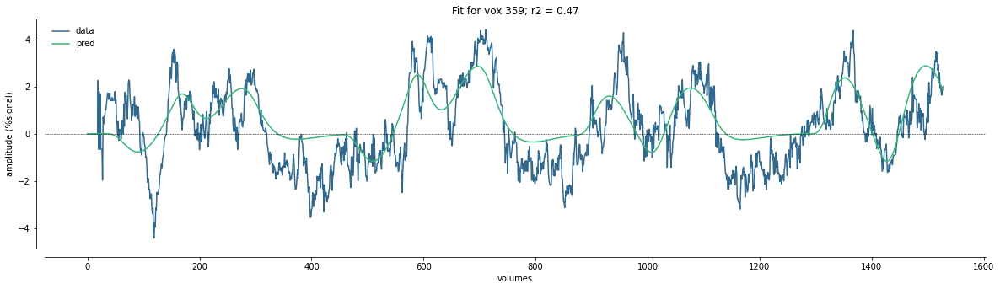

In [66]:
data = gf_line_norm.data[4,:]
pred = np.squeeze(gg_line_norm.return_prediction(*params_line[:-1]),0)
glm.plot_array([data,pred], 
            labels=["data", "pred"], 
            x_label="volumes", 
            y_label="amplitude (%signal)",
            title=f"Fit for vox 359; r2 = {round(params_line[-1],2)}",
            figsize=(20,5),
            add_hline={'pos': 0 , 'color': 'k', 'lw': 0.5, 'ls': '--'})

In [78]:
plt.imshow(dm_1iter_acq[...,-1])
plt.show()

NameError: name 'dm_1iter_acq' is not defined